In [ ]:
!pip install pysal
!pip install contextily

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 40.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 69.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 59.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.3/141.3 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.9/53.9 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 k

In [ ]:
from pysal.lib import weights
from pysal.explore import esda
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as ctx

/usr/local/lib/python3.10/dist-packages/spaghetti/network.py:41: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)


In [ ]:
# File paths
listings_path = '/content/listings.csv.gz'
attractions_path = '/content/austin_attractions.csv'
boroughs_path = '/content/atbb.shp'

In [ ]:
# Reading the listings data
listings = pd.read_csv(listings_path, compression='gzip', low_memory=False)

**Data Cleaning and Preprocessing**

In [ ]:
# Display columns of the dataset
print("Columns in the dataset:", listings.columns)

Columns in the dataset: Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maxi

In [ ]:
print(listings.head())

     id                        listing_url       scrape_id last_scraped  \
0  5456  https://www.airbnb.com/rooms/5456  20240913025540   2024-09-13   
1  5769  https://www.airbnb.com/rooms/5769  20240913025540   2024-09-13   
2  6413  https://www.airbnb.com/rooms/6413  20240913025540   2024-09-13   
3  6448  https://www.airbnb.com/rooms/6448  20240913025540   2024-09-13   
4  8502  https://www.airbnb.com/rooms/8502  20240913025540   2024-09-13   

            source                                               name  \
0      city scrape          Walk to 6th, Rainey St and Convention Ctr   
1  previous scrape                                     NW Austin Room   
2  previous scrape                      Gem of a Studio near Downtown   
3      city scrape  Secluded Studio @ Zilker - King Bed, Bright & ...   
4      city scrape                            Woodland Studio Lodging   

                                         description  \
0  Great central  location for walking to Convent...  

In [ ]:
# Select relevant columns
listings_sub = listings[['id', 'neighbourhood_cleansed', 'beds', 'price', 'latitude', 'longitude',
                         'property_type', 'room_type', 'accommodates', 'bathrooms',
                         'bedrooms','review_scores_rating']]

In [ ]:
listings_sub.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15244 entries, 0 to 15243
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      15244 non-null  int64  
 1   neighbourhood_cleansed  15244 non-null  int64  
 2   beds                    11155 non-null  float64
 3   price                   11183 non-null  object 
 4   latitude                15244 non-null  float64
 5   longitude               15244 non-null  float64
 6   property_type           15244 non-null  object 
 7   room_type               15244 non-null  object 
 8   accommodates            15244 non-null  int64  
 9   bathrooms               11184 non-null  float64
 10  bedrooms                14306 non-null  float64
 11  review_scores_rating    12184 non-null  float64
dtypes: float64(6), int64(3), object(3)
memory usage: 1.4+ MB


**Check for missing data**

In [ ]:
# Check for missing data
print("Missing values before cleaning:")
print(listings_sub.isnull().sum())

Missing values before cleaning:
id                           0
neighbourhood_cleansed       0
beds                      4089
price                     4061
latitude                     0
longitude                    0
property_type                0
room_type                    0
accommodates                 0
bathrooms                 4060
bedrooms                   938
review_scores_rating      3060
dtype: int64


In [ ]:
# Drop rows with missing values in critical columns
listings_sub = listings_sub.dropna(subset=['price', 'beds', 'bedrooms', 'accommodates','bathrooms','review_scores_rating'])

In [ ]:
# Again Checking for missing data
print("Missing values before cleaning:")
print(listings_sub.isnull().sum())

Missing values before cleaning:
id                        0
neighbourhood_cleansed    0
beds                      0
price                     0
latitude                  0
longitude                 0
property_type             0
room_type                 0
accommodates              0
bathrooms                 0
bedrooms                  0
review_scores_rating      0
dtype: int64


In [ ]:
# Cleaning and converting the 'price' column
listings_sub.loc[:, "price"] = listings_sub["price"].replace("[$,]", "", regex=True).astype(float)

In [ ]:
# Confirm conversion and check for any remaining non-numeric entries
print("Sample data after cleaning the 'price' column:")
print(listings_sub[['price']].head())

Sample data after cleaning the 'price' column:
   price
0  111.0
3  159.0
4   48.0
5  575.0
6  138.0


In [ ]:
listings_sub.loc[:, 'beds'] = listings_sub['beds'].fillna(listings_sub['beds'].median())
listings_sub.loc[:, 'bathrooms'] = listings_sub['bathrooms'].fillna(listings_sub['bathrooms'].median())
listings_sub.loc[:, 'bedrooms'] = listings_sub['bedrooms'].fillna(
    listings_sub.groupby('neighbourhood_cleansed')['bedrooms'].transform('median')
)
listings_sub.loc[:, 'review_scores_rating'] = listings_sub['review_scores_rating'].fillna(
    listings_sub['review_scores_rating'].median()
)
listings_sub.dropna(subset=['price'], inplace=True)

<ipython-input-14-7e85e9910626>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_sub.dropna(subset=['price'], inplace=True)


In [ ]:
# Again Confirm conversion and check for any remaining non-numeric entries
print("Sample data after cleaning the 'price' column:")
print(listings_sub[['price']].head())

Sample data after cleaning the 'price' column:
   price
0  111.0
3  159.0
4   48.0
5  575.0
6  138.0


In [ ]:
# Again Checking for missing data
print("Missing values before cleaning:")
print(listings_sub.isnull().sum())

Missing values before cleaning:
id                        0
neighbourhood_cleansed    0
beds                      0
price                     0
latitude                  0
longitude                 0
property_type             0
room_type                 0
accommodates              0
bathrooms                 0
bedrooms                  0
review_scores_rating      0
dtype: int64


In [ ]:
listings_sub.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9366 entries, 0 to 15191
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      9366 non-null   int64  
 1   neighbourhood_cleansed  9366 non-null   int64  
 2   beds                    9366 non-null   float64
 3   price                   9366 non-null   object 
 4   latitude                9366 non-null   float64
 5   longitude               9366 non-null   float64
 6   property_type           9366 non-null   object 
 7   room_type               9366 non-null   object 
 8   accommodates            9366 non-null   int64  
 9   bathrooms               9366 non-null   float64
 10  bedrooms                9366 non-null   float64
 11  review_scores_rating    9366 non-null   float64
dtypes: float64(6), int64(3), object(3)
memory usage: 951.2+ KB


In [ ]:
listings_sub['price'] = listings_sub['price'].replace("[$,]", "", regex=True).astype(float)

<ipython-input-18-cbc251cfadd8>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  listings_sub['price'] = listings_sub['price'].replace("[$,]", "", regex=True).astype(float)
<ipython-input-18-cbc251cfadd8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_sub['price'] = listings_sub['price'].replace("[$,]", "", regex=True).astype(float)


In [ ]:
print(listings_sub['price'].dtype)  # Should show float64

float64


In [ ]:
# Final check for missing values
print("Missing values after cleaning:")
print(listings_sub.isnull().sum())

Missing values after cleaning:
id                        0
neighbourhood_cleansed    0
beds                      0
price                     0
latitude                  0
longitude                 0
property_type             0
room_type                 0
accommodates              0
bathrooms                 0
bedrooms                  0
review_scores_rating      0
dtype: int64


**Exploratory Data Analysis & Processing**

In [ ]:
# Display data types of each column to ensure they are appropriate
print("Data types after initial cleaning:")
print(listings_sub.dtypes)

Data types after initial cleaning:
id                          int64
neighbourhood_cleansed      int64
beds                      float64
price                     float64
latitude                  float64
longitude                 float64
property_type              object
room_type                  object
accommodates                int64
bathrooms                 float64
bedrooms                  float64
review_scores_rating      float64
dtype: object


In [ ]:
# Describe the price variable for initial analysis
print("Price distribution summary:")
print(listings_sub["price"].describe())

Price distribution summary:
count     9366.000000
mean       262.665385
std        683.373544
min          8.000000
25%         90.000000
50%        140.000000
75%        236.000000
max      10000.000000
Name: price, dtype: float64


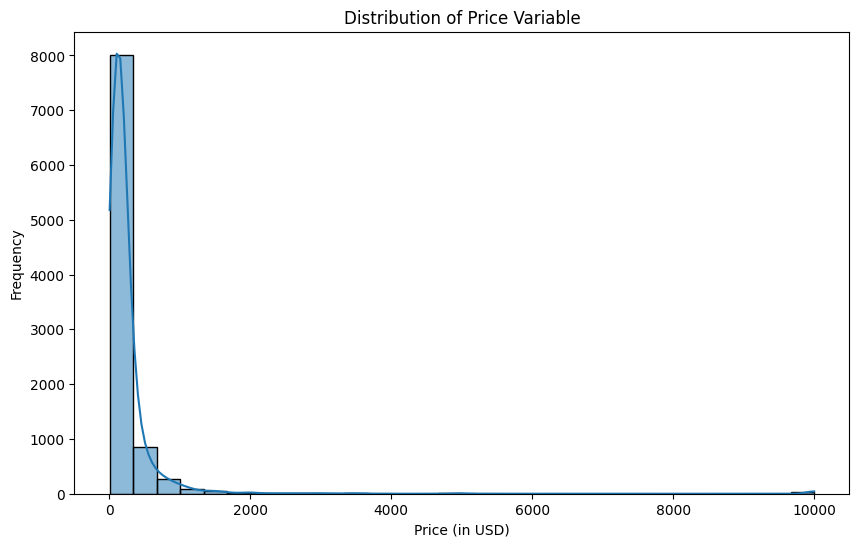

In [ ]:
# Plotting the distribution of Price variable
plt.figure(figsize=(10, 6))
sns.histplot(listings_sub["price"], kde=True, bins=30)
plt.title("Distribution of Price Variable")
plt.xlabel("Price (in USD)")
plt.ylabel("Frequency")
plt.show()

In [ ]:
Q1 = listings_sub['price'].quantile(0.25)
Q3 = listings_sub['price'].quantile(0.75)
IQR = Q3 - Q1

upper_limit = Q3 + 2 * IQR  # Increase the threshold to retain more data
lower_limit = max(Q1 - 1.5 * IQR, listings_sub['price'].min())  # Avoid negative values

In [ ]:
print(f"Upper Limit: {upper_limit}")
print(f"Lower Limit: {lower_limit}")

Upper Limit: 528.0
Lower Limit: 8.0


In [ ]:
# Outlier Detection
Q1 = listings_sub['price'].quantile(0.25)
Q3 = listings_sub['price'].quantile(0.75)
IQR = Q3 - Q1

outliers = listings_sub[(listings_sub['price'] < (Q1 - 1.5 * IQR)) |
                        (listings_sub['price'] > (Q3 + 1.5 * IQR))]
print(f'Number of outliers: {len(outliers)}')

Number of outliers: 920


In [ ]:
listings_sub = listings_sub[(listings_sub['price'] >= 8) &
                            (listings_sub['price'] <= 568)]

count    8690.000000
mean      162.100345
std       106.757624
min         8.000000
25%        87.000000
50%       131.000000
75%       204.000000
max       567.000000
Name: price, dtype: float64


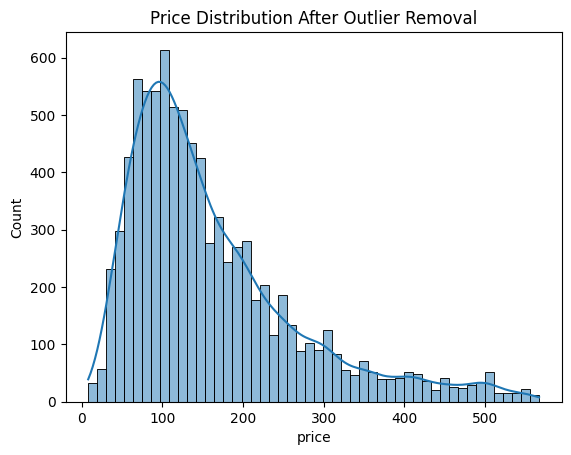

Remaining rows after outlier removal: 8690


In [ ]:
print(listings_sub['price'].describe())
sns.histplot(listings_sub['price'], bins=50, kde=True)
plt.title('Price Distribution After Outlier Removal')
plt.show()

print(f"Remaining rows after outlier removal: {len(listings_sub)}")

<Axes: xlabel='longitude', ylabel='latitude'>

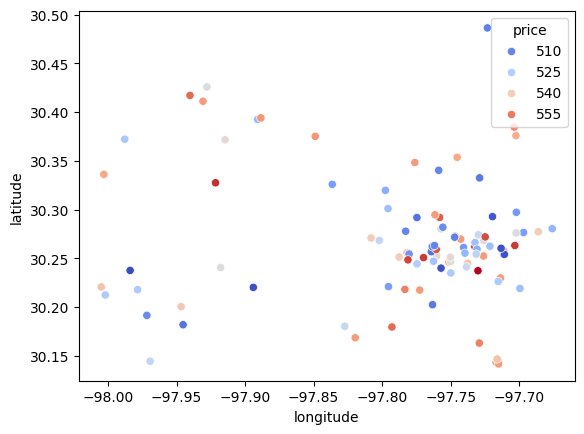

In [ ]:
high_price_listings = listings_sub[listings_sub['price'] > 500]
sns.scatterplot(x='longitude', y='latitude', hue='price', data=high_price_listings, palette='coolwarm')

In [ ]:
print(listings_sub.describe())

                 id  neighbourhood_cleansed         beds        price  \
count  8.690000e+03             8690.000000  8690.000000  8690.000000   
mean   5.348787e+17            78725.237860     2.688953   162.100345   
std    4.690274e+17               20.656476     2.121530   106.757624   
min    5.456000e+03            78701.000000     0.000000     8.000000   
25%    4.208364e+07            78704.000000     1.000000    87.000000   
50%    6.738947e+17            78724.000000     2.000000   131.000000   
75%    9.688698e+17            78745.000000     3.000000   204.000000   
max    1.241410e+18            78759.000000    27.000000   567.000000   

          latitude    longitude  accommodates    bathrooms     bedrooms  \
count  8690.000000  8690.000000   8690.000000  8690.000000  8690.000000   
mean     30.279494   -97.749105      4.938090     1.585328     1.948677   
std       0.065255     0.065995      3.186653     0.777642     1.292840   
min      30.097450   -98.053350      1.000

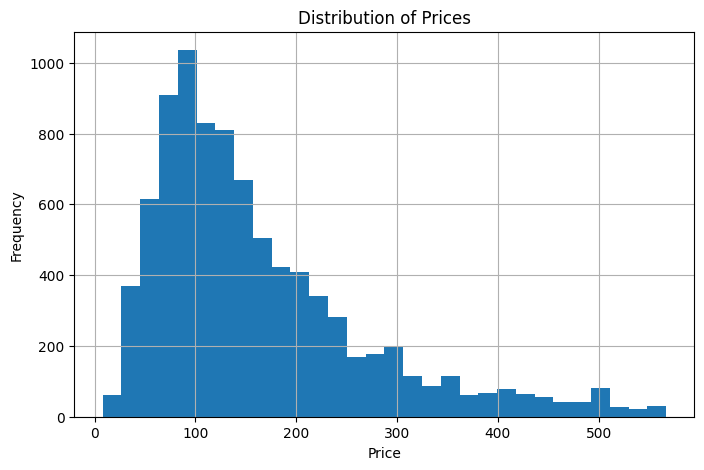

In [ ]:
#Visualize the Distribution of Prices
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
listings_sub['price'].hist(bins=30)
plt.title('Distribution of Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

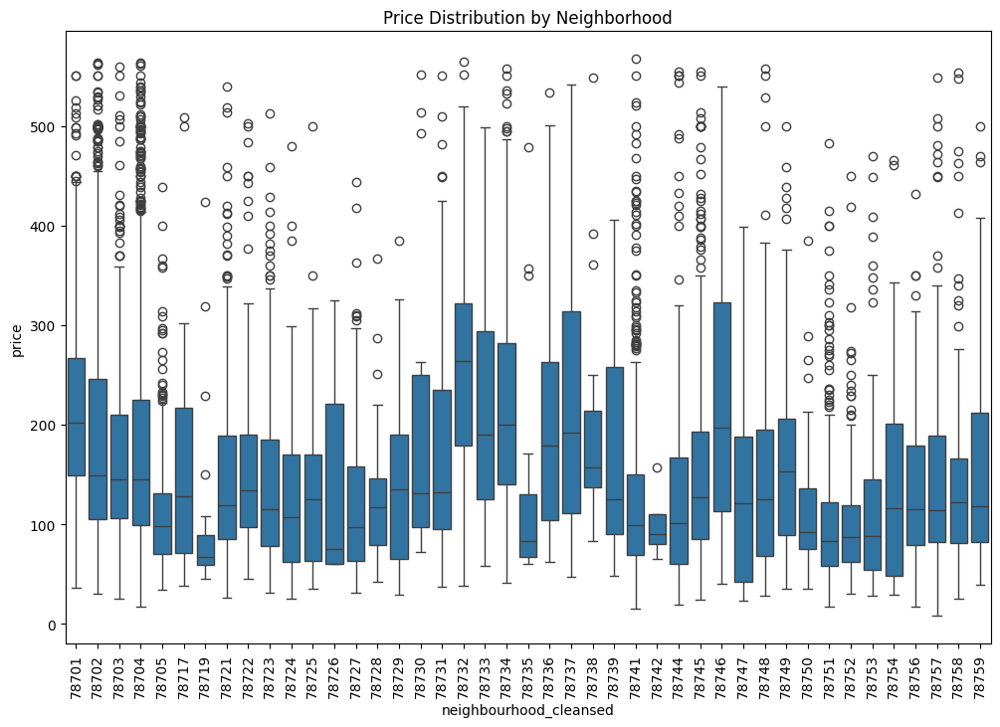

In [ ]:
#Price By Neighbourhood
plt.figure(figsize=(12, 8))
sns.boxplot(x='neighbourhood_cleansed', y='price', data=listings_sub)
plt.xticks(rotation=90)
plt.title('Price Distribution by Neighborhood')
plt.show()

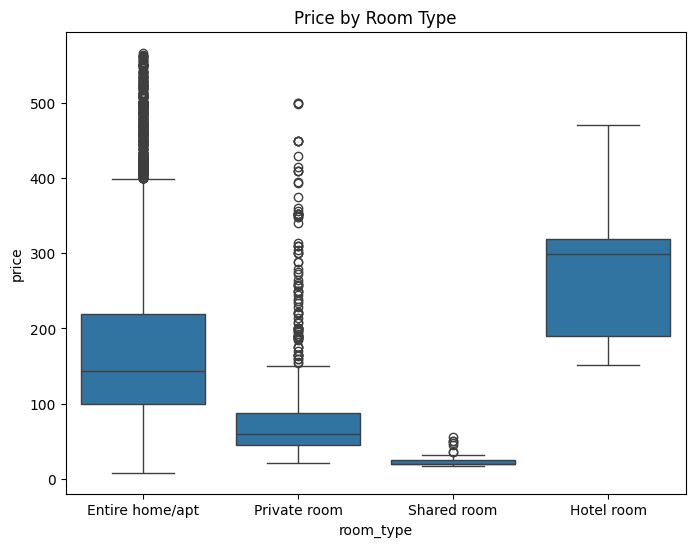

In [ ]:
#Room type and price relationship
plt.figure(figsize=(8, 6))
sns.boxplot(x='room_type', y='price', data=listings_sub)
plt.title('Price by Room Type')
plt.show()

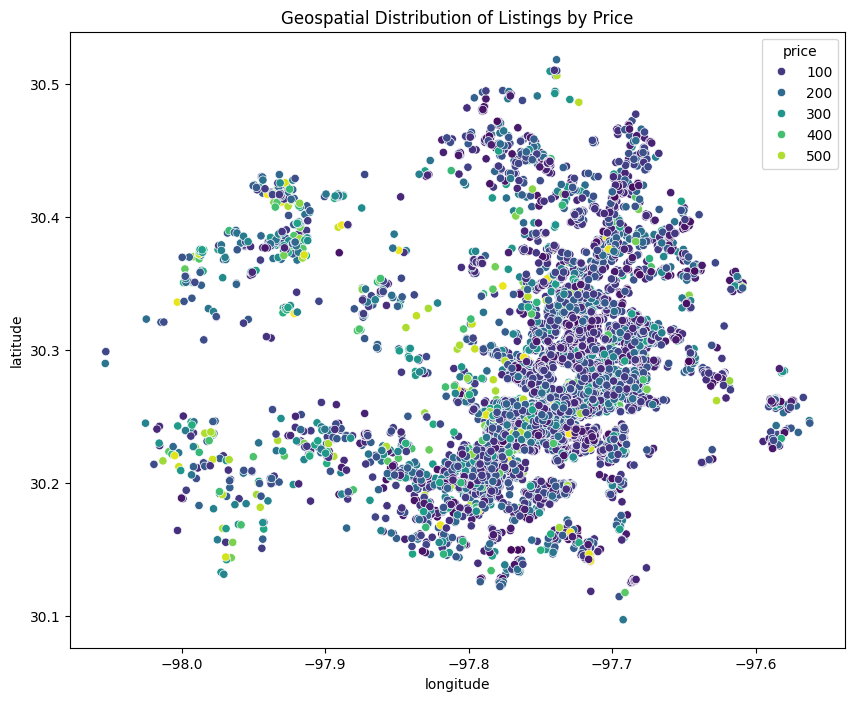

In [ ]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='longitude', y='latitude', hue='price', palette='viridis', data=listings_sub)
plt.title('Geospatial Distribution of Listings by Price')
plt.show()


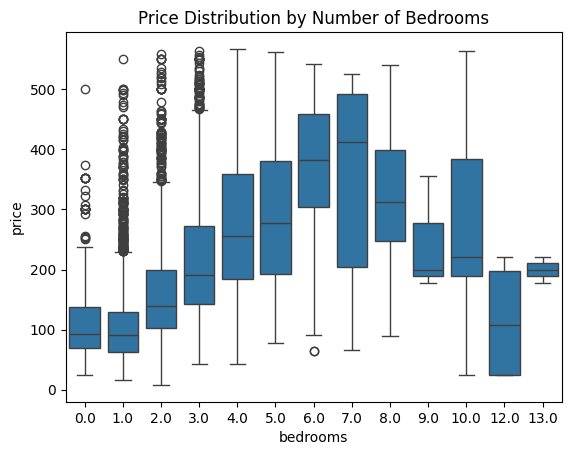

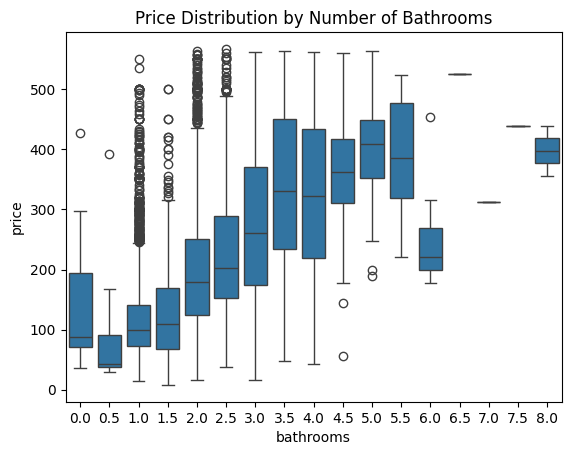

In [ ]:
#Exploring how bedrooms and bathrooms influence price.
sns.boxplot(x='bedrooms', y='price', data=listings_sub)
plt.title('Price Distribution by Number of Bedrooms')
plt.show()

sns.boxplot(x='bathrooms', y='price', data=listings_sub)
plt.title('Price Distribution by Number of Bathrooms')
plt.show()

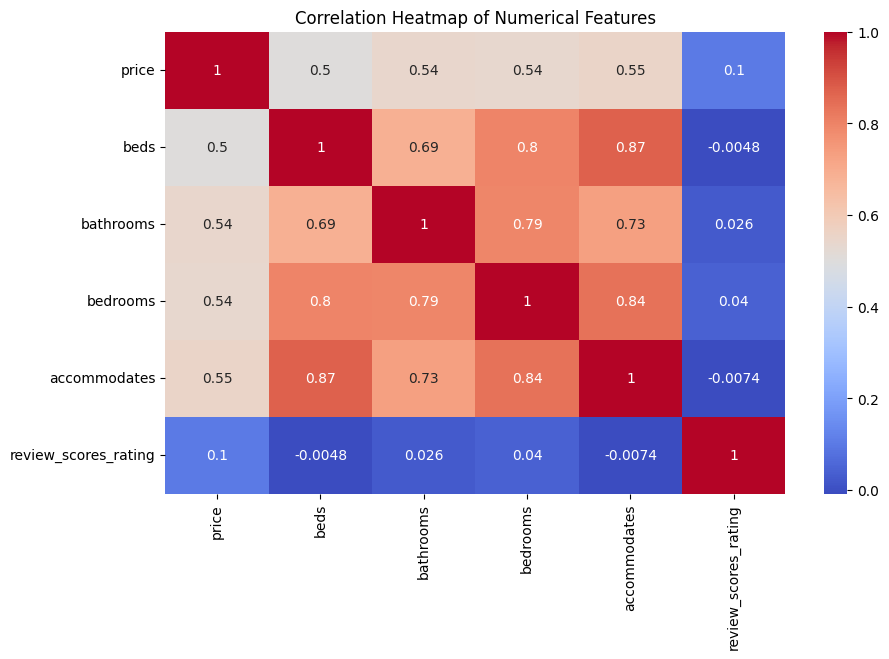

In [ ]:
#Heatmap between price and features
plt.figure(figsize=(10, 6))
correlation_matrix = listings_sub[['price', 'beds', 'bathrooms', 'bedrooms', 'accommodates', 'review_scores_rating']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

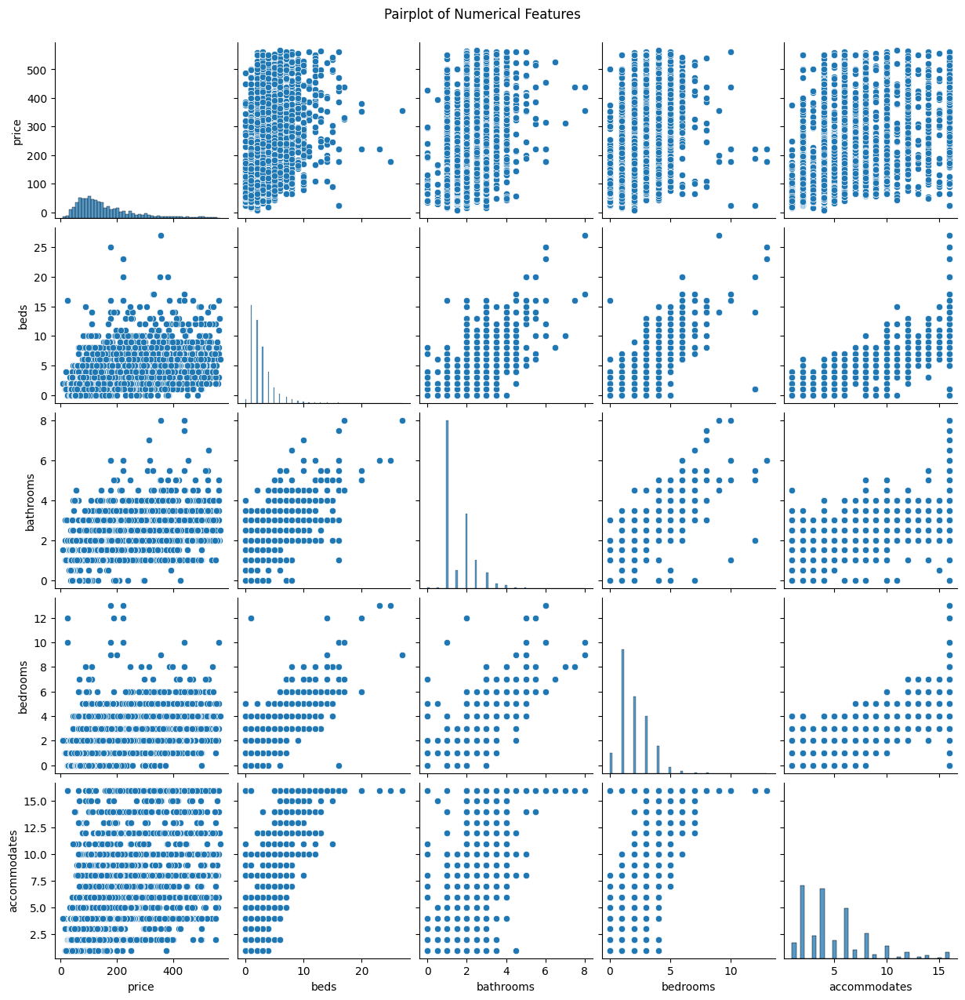

In [ ]:
sns.pairplot(listings_sub[['price', 'beds', 'bathrooms', 'bedrooms', 'accommodates']])
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

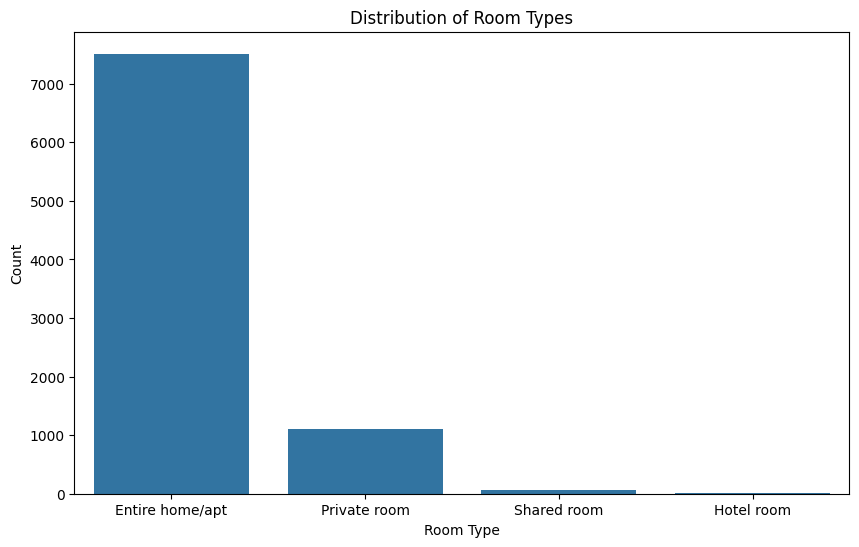

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='room_type', data=listings_sub)
plt.title('Distribution of Room Types')
plt.xlabel('Room Type')
plt.ylabel('Count')
plt.show()

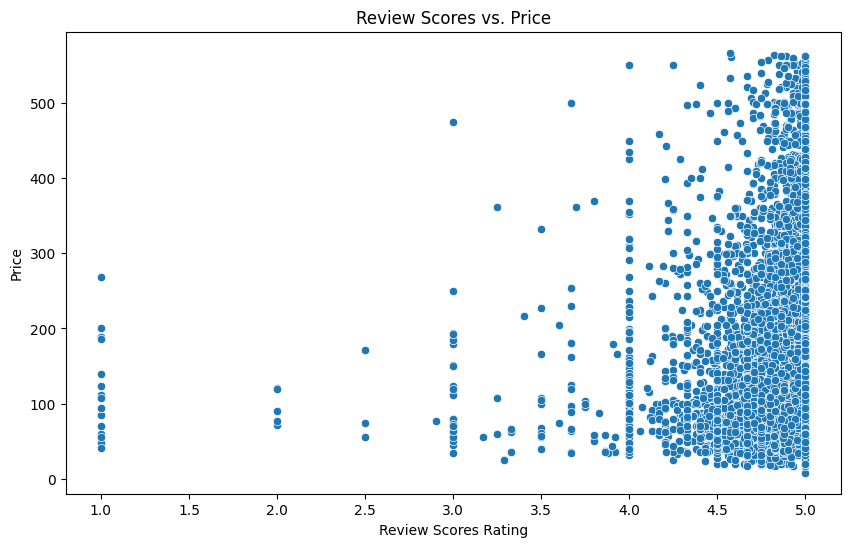

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='review_scores_rating', y='price', data=listings_sub)
plt.title('Review Scores vs. Price')
plt.xlabel('Review Scores Rating')
plt.ylabel('Price')
plt.show()

<Axes: xlabel='review_scores_rating', ylabel='price'>

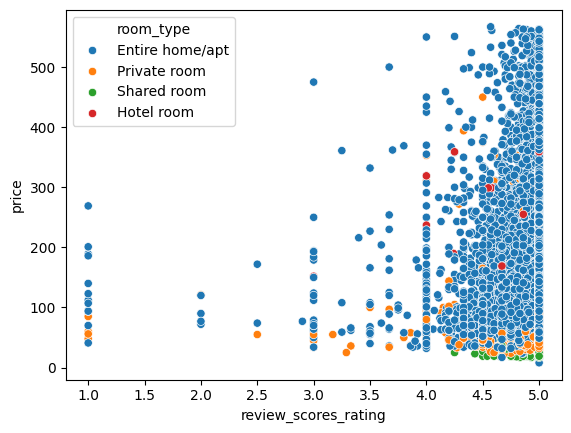

In [ ]:
sns.scatterplot(x='review_scores_rating', y='price', hue='room_type', data=listings_sub)

<Axes: xlabel='review_scores_rating', ylabel='price'>

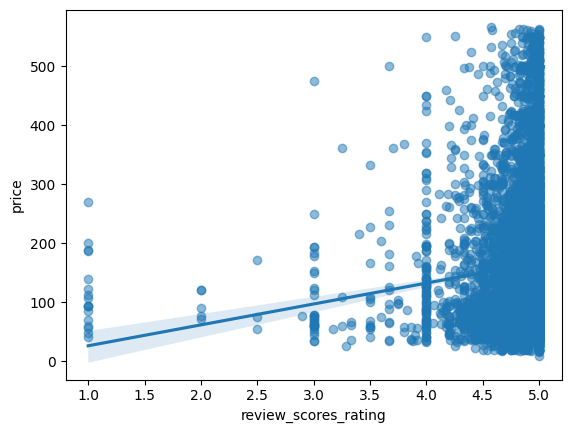

In [ ]:
sns.regplot(x='review_scores_rating', y='price', data=listings_sub, scatter_kws={'alpha':0.5})

In [ ]:
# Convert listings to a GeoPandas DataFrame
listings_gpdf = gpd.GeoDataFrame(
    listings_sub,
    geometry=gpd.points_from_xy(listings_sub['longitude'], listings_sub['latitude']),
    crs="EPSG:4326"
)

In [ ]:
# Reading the Austin borough shapefile
boroughs = gpd.read_file(boroughs_path)
# Projecting the boroughs to match listings' CRS if needed
boroughs = boroughs.to_crs("EPSG:4326")

In [ ]:
# Reading the attractions data
attractions = pd.read_csv(attractions_path)
print("Attractions data columns:", attractions.columns)

Attractions data columns: Index(['Attraction', 'Address', 'Latitude', 'Longitude'], dtype='object')


In [ ]:
# Convert attractions to GeoDataFrame
attractions_gpdf = gpd.GeoDataFrame(
    attractions,
    geometry=gpd.points_from_xy(attractions['Longitude'], attractions['Latitude']),
    crs="EPSG:4326"
)

In [ ]:
# Filter listings to only include those within the Austin area
austin_boundary = boroughs
listings_austin_mask = listings_gpdf.within(austin_boundary.unary_union)
listings_austin = listings_gpdf.loc[listings_austin_mask]


<ipython-input-46-b17f27d2fce7>:3: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  listings_austin_mask = listings_gpdf.within(austin_boundary.unary_union)


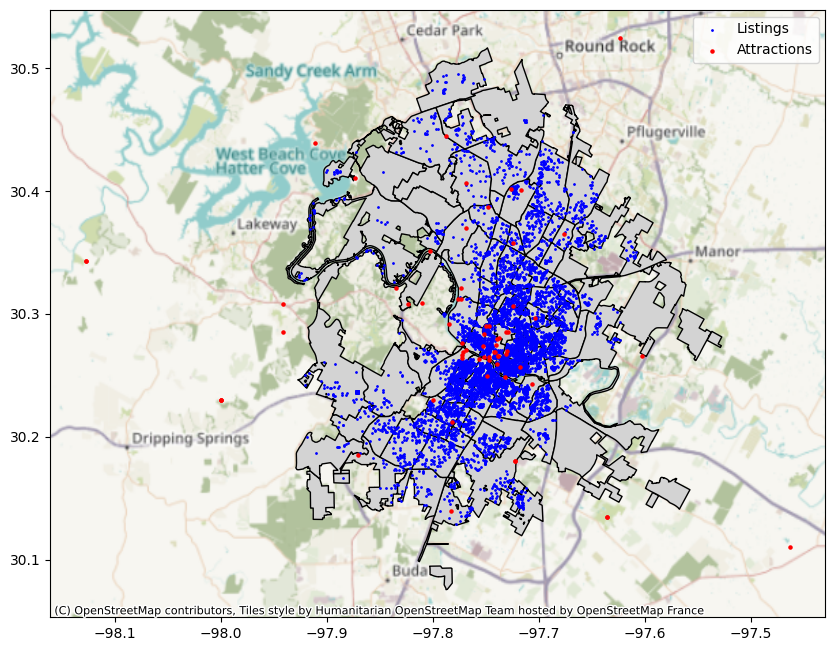

In [ ]:
# Plotting the listings and attractions on a basemap
fig, ax = plt.subplots(figsize=(10, 10))
austin_boundary.plot(ax=ax, color='lightgrey', edgecolor='black')
listings_austin.plot(ax=ax, color='blue', markersize=1, label='Listings')
attractions_gpdf.plot(ax=ax, color='red', markersize=5, label='Attractions')
ctx.add_basemap(ax, crs=listings_gpdf.crs.to_string())
plt.legend()
plt.show()

In [ ]:
from shapely.ops import nearest_points

# Ensures CRS matches for distance calculations
attractions_gpdf = attractions_gpdf.to_crs(listings_gpdf.crs)

# Function to calculate distance to nearest attraction
def nearest_attraction_distance(listing_point, attractions_gpdf):
    nearest_geom = nearest_points(listing_point, attractions_gpdf.unary_union)[1]
    return listing_point.distance(nearest_geom)

# Calculate distance for each listing
listings_gpdf['distance_to_attraction'] = listings_gpdf['geometry'].apply(
    lambda x: nearest_attraction_distance(x, attractions_gpdf)
)

<ipython-input-48-8132925d3dbc>:8: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  nearest_geom = nearest_points(listing_point, attractions_gpdf.unary_union)[1]


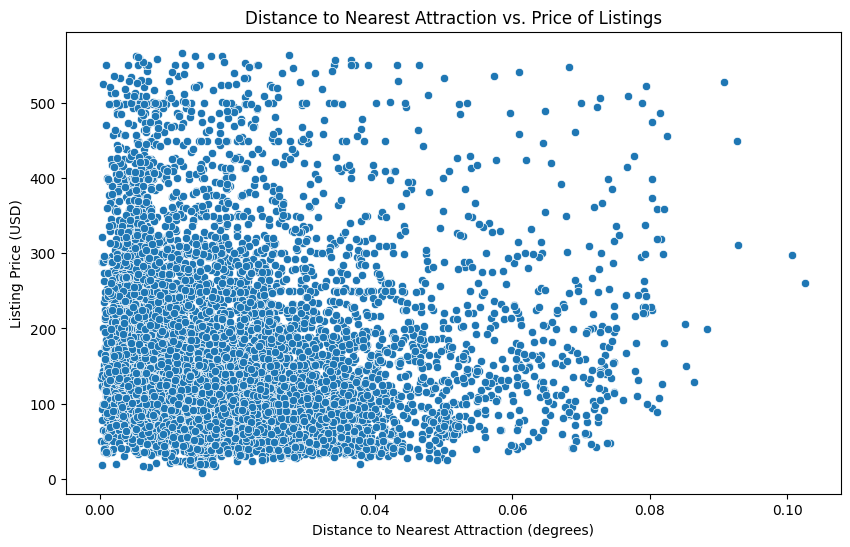

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='distance_to_attraction', y='price', data=listings_gpdf)
plt.title('Distance to Nearest Attraction vs. Price of Listings')
plt.xlabel('Distance to Nearest Attraction (degrees)')
plt.ylabel('Listing Price (USD)')
plt.show()

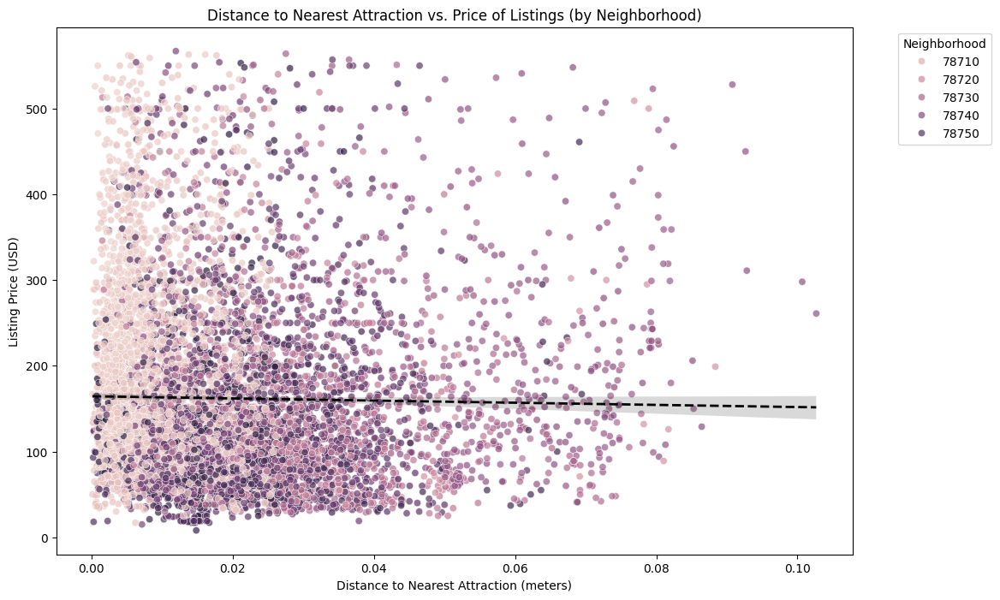

In [ ]:
# Plot Distance vs. Price with Trend Line and Neighborhood Coloring
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='distance_to_attraction',
    y='price',
    hue='neighbourhood_cleansed',  # Color by neighborhood
    data=listings_gpdf,
    alpha=0.7  # Slight transparency for overlap
)

# Add trend line
sns.regplot(
    x='distance_to_attraction',
    y='price',
    data=listings_gpdf,
    scatter=False,
    color='black',  # Trend line color
    line_kws={'linewidth': 2, 'linestyle': '--'}  # Dotted trend line
)

plt.title('Distance to Nearest Attraction vs. Price of Listings (by Neighborhood)')
plt.xlabel('Distance to Nearest Attraction (meters)')
plt.ylabel('Listing Price (USD)')
plt.legend(title="Neighborhood", bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside plot
plt.show()


<Axes: xlabel='distance_to_attraction', ylabel='price'>

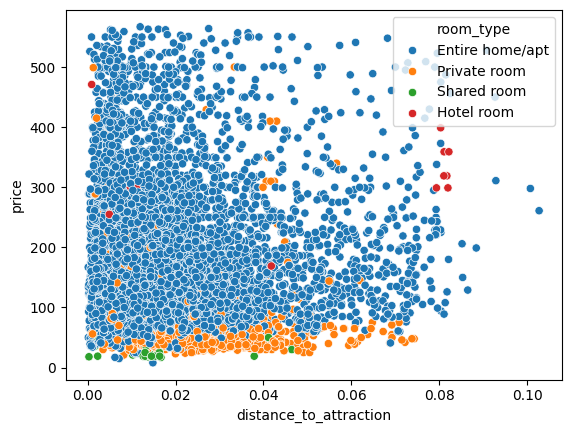

In [ ]:
sns.scatterplot(x='distance_to_attraction', y='price', hue='room_type', data=listings_gpdf)

In [ ]:
# Defining the variables of interest (VOI) to subset the data
voi = [
    'id',  # Unique identifier for the listing
    'room_type',  # Type of room
    'accommodates',  # The maximum capacity of the listing
    'bedrooms',  # The number of bedrooms
    'beds',  # The number of beds
    'review_scores_rating',  # The rating
    'price',  # The nightly rental rate, dependent variable (Y)
    #'rt_entire_home_apartment',
    #'rt_private_room',
    #'rt_shared_room'
]

In [ ]:
# Ensures the selected columns exist in the Austin listings data
existing_columns = [col for col in voi if col in listings_austin.columns]
print("Existing columns in dataset:", existing_columns)

Existing columns in dataset: ['id', 'room_type', 'accommodates', 'bedrooms', 'beds', 'review_scores_rating', 'price']


In [ ]:
# Subsetting the Austin listings data
listings_austin_subset = listings_austin[voi]

In [ ]:
listings_austin_subset.dtypes

,0
id,int64
room_type,object
accommodates,int64
bedrooms,float64
beds,float64
review_scores_rating,float64
price,float64


In [ ]:
# Display the first few rows of the subset
print(listings_austin_subset.head())

       id        room_type  accommodates  bedrooms  beds  \
0    5456  Entire home/apt             3       1.0   2.0   
3    6448  Entire home/apt             2       1.0   2.0   
4    8502  Entire home/apt             2       1.0   1.0   
6  354263  Entire home/apt             4       1.0   6.0   
8   13035  Entire home/apt             3       2.0   2.0   

   review_scores_rating  price  
0                  4.84  111.0  
3                  4.97  159.0  
4                  4.56   48.0  
6                  4.90  138.0  
8                  5.00  135.0  


In [ ]:
for col in listings_austin[['room_type']]:
    print(listings_austin[col].unique())

['Entire home/apt' 'Private room' 'Shared room' 'Hotel room']


In [ ]:
#One-hot encode the room_type variable
#For the room_type, all 0s represent 'Hotel room'
# listings_austin_subset.loc[:, 'rt_entire_home_apartment'] = np.where(listings_austin_subset["room_type"] == 'Entire home/apt', 1, 0)
# listings_austin_subset.loc[:, 'rt_private_room'] = np.where(listings_austin_subset["room_type"] == 'Private room', 1, 0)
# listings_austin_subset.loc[:, 'rt_shared_room'] = np.where(listings_austin_subset["room_type"] == 'Shared room', 1, 0)
# One-hot encode the 'room_type' column
listings_austin_subset = pd.get_dummies(listings_austin_subset, columns=['room_type'], prefix='rt', drop_first=False)

In [ ]:
listings_austin_subset['price'].values

array([111., 159.,  48., ..., 181.,  94., 203.])

In [ ]:
#Log transform the 'price' variable
listings_austin_subset.loc[:, 'log_price'] = np.log(listings_austin_subset['price'])

In [ ]:
# Checking for missingness in the Austin subset
print('Total Records:', len(listings_austin_subset))
print("Missing values in each column:")
print(listings_austin_subset.isna().sum())

Total Records: 7757
Missing values in each column:
id                      0
accommodates            0
bedrooms                0
beds                    0
review_scores_rating    0
price                   0
rt_Entire home/apt      0
rt_Hotel room           0
rt_Private room         0
rt_Shared room          0
log_price               0
dtype: int64


# **OLS Regression Analysis**

In [ ]:
from pysal.model import spreg

In [ ]:
# Defining a list of explanatory variables for the Austin listings subset
m_vars = [
    'accommodates',
    'bedrooms',
    'beds',
    'review_scores_rating',
    # 'rt_entire_home_apartment',
    # 'rt_private_room',
    # 'rt_shared_room'
]

In [ ]:
# Running an OLS regression
ols_m = spreg.OLS(
    listings_austin_subset[["log_price"]].values,  # the dependent variable (Y)
    listings_austin_subset[m_vars].values,         # the independent variables (Xs)
    name_y='log_price',
    name_x=m_vars
)


In [ ]:
print(ols_m.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:        7757
Mean dependent var  :      4.8699                Number of Variables   :           5
S.D. dependent var  :      0.6316                Degrees of Freedom    :        7752
R-squared           :      0.3235
Adjusted R-squared  :      0.3232
Sum squared residual:     2093.05                F-statistic           :    926.8284
Sigma-square        :       0.270                Prob(F-statistic)     :           0
S.E. of regression  :       0.520                Log likelihood        :   -5925.983
Sigma-square ML     :       0.270                Akaike info criterion :   11861.966
S.E of regression ML:      0.5194                Schwarz criterion     :   11896.748

------------------------------------------------------------

In [ ]:
#Residual Analysis - Extract residuals
residuals = ols_m.u  # PySAL stores residuals in 'u'

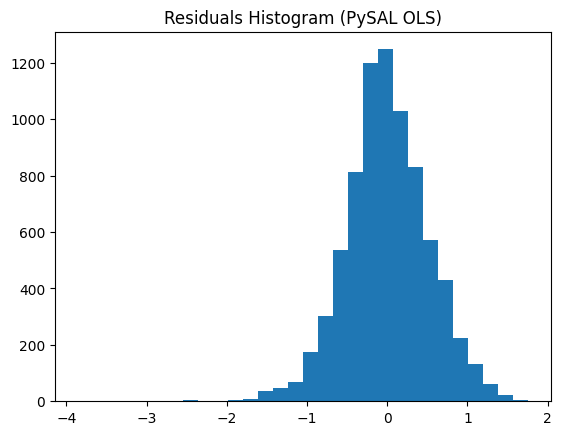

In [ ]:
#Plot histogram of residuals
plt.figure()
plt.hist(residuals, bins=30)
plt.title('Residuals Histogram (PySAL OLS)')
plt.show()

# **Exploring unmodeled relationships**

In [ ]:
# Creating a column to store the model residuals
listings_austin_subset["ols_m_r"] = ols_m.u

In [ ]:
# Bringing back in the neighborhood variable
listings_austin_subset = listings_austin_subset.merge(
    listings[['id', 'neighbourhood_cleansed']],
    how='left',
    on='id'
)

In [ ]:
# Get the average value of the residual by neighborhood
mean = (
    listings_austin_subset.groupby("neighbourhood_cleansed")
    .ols_m_r.mean()
    .to_frame("neighborhood_residual")
)


In [ ]:
# Creating a dataframe to store the residuals by neighborhood
residuals_neighborhood = listings_austin_subset.merge(
    mean,
    how="left",
    left_on="neighbourhood_cleansed",
    right_index=True
).sort_values("neighborhood_residual")

In [ ]:
# Displaying the result
print(residuals_neighborhood.head())

                      id  accommodates  bedrooms  beds  review_scores_rating  \
5884  974217757210180017             2       1.0   2.0                  5.00   
2603            50344928             1       1.0   1.0                  5.00   
5557  936274678640445773            10       4.0   6.0                  4.44   
2928            52634578             2       1.0   1.0                  4.94   
2584            50268159             1       1.0   1.0                  5.00   

      price  rt_Entire home/apt  rt_Hotel room  rt_Private room  \
5884   71.0               False          False             True   
2603   50.0               False          False             True   
5557  168.0                True          False            False   
2928   49.0               False          False             True   
2584   39.0               False          False             True   

      rt_Shared room  log_price   ols_m_r  neighbourhood_cleansed  \
5884           False   4.262680 -0.322391      

In [ ]:
import plotly.express as px
from IPython.core.display import HTML

In [ ]:
# Step 3: Violin Plot for Residual Distribution by Neighborhood
fig = px.violin(
    residuals_neighborhood,
    x="neighbourhood_cleansed",
    y="ols_m_r",
    color="neighbourhood_cleansed",
    box=True,
    points="all"  # Show individual points
)

fig.update_layout(
    xaxis_title="Neighborhood",
    yaxis_title="Residuals",
    xaxis=dict(tickangle=90),  # Rotate labels for readability
    height=700
)

# Display Violin Plot
HTML(fig.to_html())

# **Neighborhoods GeoJSON**

In [ ]:
import textwrap

In [ ]:
# Producing a map of the average residual by neighborhood
import requests
import geopandas as gpd
from shapely.geometry import shape

# Reading in the NYC Neighborhoods shapefile from data file
import os

In [ ]:
# Path to the Austin neighborhoods GeoJSON file
austin_neighborhoods_path ='/content/Austin_Neighborhoods.geojson'

In [ ]:
# Load Austin neighborhoods GeoJSON file
austin_n = gpd.read_file(austin_neighborhoods_path)

In [ ]:
# Display column names in the Austin neighborhoods GeoJSON file
print(austin_n.columns)

Index(['fid', 'shape_area', 'sqmiles', 'neighname', 'shape_leng',
       'shape_length', 'target_fid', 'Zip_Code', 'geometry'],
      dtype='object')


In [ ]:
print(austin_n.head)

<bound method NDFrame.head of     fid          shape_area         sqmiles           neighname  \
0    49  43080006.470703125   1.54528259042                 MLK   
1    25  18999948.447265625  0.681529369869   EAST CESAR CHAVEZ   
2    54    27497968.1953125  0.986353900418         NORTH LAMAR   
3    40        19850224.375  0.712028825185               HOLLY   
4    89  16341729.115234375  0.586178883901       WEST CONGRESS   
..   ..                 ...             ...                 ...   
98   77  38724954.197265625    1.3890665973      SOUTH MANCHACA   
99   94  34699745.255859375   1.24468207697       WINDSOR HILLS   
100  86  31637957.330078125   1.13485555729    UNIVERSITY HILLS   
101  66  86951571.654296875   3.11895847019        POND SPRINGS   
102  23  109185418.69140625   3.91648800821  DITTMAR--SLAUGHTER   

        shape_leng        shape_length target_fid Zip_Code  \
0    33470.4154302  33470.415430156361         49    78722   
1    17660.7863376  17660.786337593843   

In [ ]:
print(mean.columns)

Index(['neighborhood_residual'], dtype='object')


In [ ]:
print("austin_n columns:", austin_n.columns)
print("mean columns:", mean.columns)

austin_n columns: Index(['fid', 'shape_area', 'sqmiles', 'neighname', 'shape_leng',
       'shape_length', 'target_fid', 'Zip_Code', 'geometry'],
      dtype='object')
mean columns: Index(['neighborhood_residual'], dtype='object')


In [ ]:
mean = (
    listings_austin_subset.groupby("neighbourhood_cleansed")["ols_m_r"]
    .mean()
    .reset_index()
    .rename(columns={"ols_m_r": "neighborhood_residual"})
)


In [ ]:
# Convert both columns to string type to ensure they match
austin_n['neighname'] = austin_n['neighname'].astype(str)
mean['neighbourhood_cleansed'] = mean['neighbourhood_cleansed'].astype(str)

# Now performing the merge
austin_n_r = austin_n.merge(mean, left_on='Zip_Code', right_on="neighbourhood_cleansed")


In [ ]:
print("Unique values in austin_n['Zip_Code']:", austin_n['Zip_Code'].unique())
print("Unique values in mean['neighbourhood_cleansed']:", mean['neighbourhood_cleansed'].unique())

Unique values in austin_n['Zip_Code']: ['78722' '78702' '78753' '78745' '78735' '78728' '78704' '78729' '78730'
 '78749' '78752' '78741' '78744' '78748' '78756' '78754' '78759' '78734'
 '78758' '78751' '78703' '78721' '78705' '78726' '78723' '78747' '78724'
 '78757' '78750' '78731' '78717' '78733' '78742' '78746' '78732' '78701'
 '78736' '78739' '78719' '78712' '78725' '78727']
Unique values in mean['neighbourhood_cleansed']: ['78701' '78702' '78703' '78704' '78705' '78717' '78721' '78722' '78723'
 '78724' '78725' '78726' '78727' '78728' '78729' '78730' '78731' '78732'
 '78733' '78734' '78735' '78736' '78739' '78741' '78742' '78744' '78745'
 '78746' '78747' '78748' '78749' '78750' '78751' '78752' '78753' '78754'
 '78756' '78757' '78758' '78759']


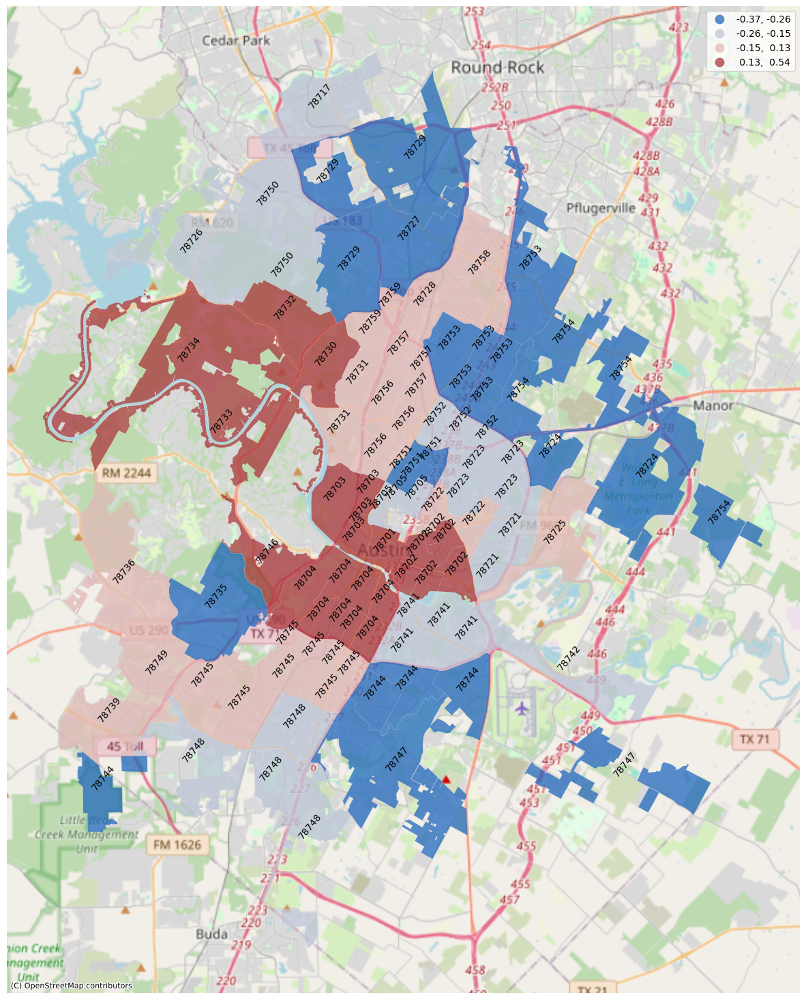

In [ ]:
# Plot the average residuals by neighborhood
fig, ax = plt.subplots(1, figsize=(15, 25))

# Plot choropleth of neighborhood residuals
austin_n_r.plot(
    column='neighborhood_residual',
    cmap='vlag',
    scheme='quantiles',
    k=4,
    edgecolor='white',
    linewidth=0.1,
    alpha=0.75,
    legend=True,
    ax=ax
)

# Add basemap with OpenStreetMap provider
ctx.add_basemap(
    ax,
    crs=austin_n.crs,
    source=ctx.providers.OpenStreetMap.Mapnik
)

# Annotate each neighborhood with its zip code only
for idx, row in austin_n_r.iterrows():
    zip_code = row['Zip_Code'] if 'Zip_Code' in austin_n_r.columns else ""
    if zip_code:
        plt.annotate(
            text=zip_code,
            xy=(row.geometry.centroid.x, row.geometry.centroid.y),
            horizontalalignment='center',
            fontsize=10,
            rotation=50
        )

# Remove axis
ax.set_axis_off()

# Display plot
plt.show()


In [ ]:
# Bringing in the geometry attribute for spatial analysis
#
residuals_neighborhood = residuals_neighborhood.merge(
    listings_austin[['id', 'geometry']], how='left', on='id'
)


# Building the spatial weights matrix using K-Nearest Neighbors (KNN) with k=5
knn = weights.KNN.from_dataframe(residuals_neighborhood, k=11)

# Constructing the spatial lag of the residuals
lag_residual = weights.spatial_lag.lag_spatial(knn, ols_m.u)

# Plotting the spatial lag of residuals against the OLS residuals
fig = px.scatter(
    x=ols_m.u.flatten(),
    y=lag_residual.flatten(),
    trendline="ols",
    width=800,
    height=800
)

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals",
    yaxis_title="Spatially Lagged Residuals"
)

# Display the plot
fig.show()

/usr/local/lib/python3.10/dist-packages/libpysal/weights/distance.py:153: UserWarning:

The weights matrix is not fully connected: 
 There are 5 disconnected components.



# **OLS Regression Analysis w/ Spatial Atributes**

### **Spatial Feature Engineering**

In [ ]:
# Load Austin attractions data
austin_attr_path = '/content/austin_attractions.csv'
austin_attr = pd.read_csv(austin_attr_path)

In [ ]:
# Convert to GeoDataFrame with geometry based on longitude and latitude
austin_attr_gpdf = gpd.GeoDataFrame(
    austin_attr,
    geometry=gpd.points_from_xy(austin_attr['Longitude'], austin_attr['Latitude']),
    crs="EPSG:4326"
)

In [ ]:
# Convert the listings and attractions GeoDataFrames to a projected coordinate system for accurate distance calculations
austin_attr_gpdf_p = austin_attr_gpdf.to_crs('EPSG:2277')  # Texas Central, suitable for Austin
listings_austin_p = listings_austin.to_crs('EPSG:2277')

In [ ]:
# Calculate the distance to each attraction for each Airbnb listing
attractions = austin_attr_gpdf['Attraction'].unique()  # Unique attraction names

In [ ]:
# Applying a lambda function that calculates the distance between each Airbnb listing and each attraction
distances = listings_austin_p.geometry.apply(lambda g: austin_attr_gpdf_p.distance(g))

In [ ]:
# Renaming the columns based on the attraction names
distances.columns = attractions

In [ ]:
# Convert distances from feet to miles (assuming EPSG:2277 uses feet)
distances = distances.apply(lambda x: x / 5280, axis=1)

In [ ]:
# Check how many attractions are within 1 to 6 miles for each listing
distances_1mi = distances.apply(lambda x: x <= 1, axis=1).sum(axis=1)
distances_2mi = distances.apply(lambda x: x <= 2, axis=1).sum(axis=1)
distances_3mi = distances.apply(lambda x: x <= 3, axis=1).sum(axis=1)
distances_4mi = distances.apply(lambda x: x <= 4, axis=1).sum(axis=1)
distances_5mi = distances.apply(lambda x: x <= 5, axis=1).sum(axis=1)
distances_6mi = distances.apply(lambda x: x <= 6, axis=1).sum(axis=1)

In [ ]:
# Creating a DataFrame combining all distance bands
distance_df = pd.concat([distances_1mi, distances_2mi, distances_3mi, distances_4mi, distances_5mi, distances_6mi], axis=1)
distance_df.columns = ['Attr_1mi', 'Attr_2mi', 'Attr_3mi', 'Attr_4mi', 'Attr_5mi', 'Attr_6mi']

In [ ]:
# Join the distances and distance bands back to the listings GeoDataFrame
listings_austin = listings_austin.merge(distances, left_index=True, right_index=True)
listings_austin = listings_austin.merge(distance_df, left_index=True, right_index=True)

In [ ]:
# Displaying the first few rows of the updated listings data with distances
print(listings_austin.head())

       id  neighbourhood_cleansed  beds  price  latitude  longitude  \
0    5456                   78702   2.0  111.0  30.26057  -97.73441   
3    6448                   78704   2.0  159.0  30.26034  -97.76487   
4    8502                   78741   1.0   48.0  30.23466  -97.73682   
6  354263                   78704   6.0  138.0  30.24821  -97.76343   
8   13035                   78702   2.0  135.0  30.26098  -97.73072   

        property_type        room_type  accommodates  bathrooms  ...  \
0   Entire guesthouse  Entire home/apt             3        1.0  ...   
3   Entire guesthouse  Entire home/apt             2        1.0  ...   
4  Entire guest suite  Entire home/apt             2        1.0  ...   
6   Entire guesthouse  Entire home/apt             4        1.0  ...   
8         Entire home  Entire home/apt             3        2.0  ...   

   Austin360 Amphitheater  Roy Kizer Golf Course Onion Creek Golf Club  \
0               10.489553               5.596042              8.79

**Modeling with Proximity Features**

In [ ]:
# Define attraction names as a list of geographic features
g_vars = austin_attr['Attraction'].unique().tolist()

# Bring the geographic features into our subset
listings_austin_subset = listings_austin_subset.merge(
    listings_austin[['id'] + g_vars],
    how='left',
    on='id'
)

# Adding geographic features to model variables used previously
g_m_vars = m_vars + g_vars

# Display the updated variables
print("Model variables including geographic features:", g_m_vars)

Model variables including geographic features: ['accommodates', 'bedrooms', 'beds', 'review_scores_rating', 'Texas State Capitol', 'Lady Bird Lake', 'Barton Springs Pool', 'Zilker Park', 'Mount Bonnell', 'The Domain', 'Congress Avenue Bridge (Bat Bridge)', 'Blanton Museum of Art', 'Bullock Texas State History Museum', 'The Contemporary Austin – Jones Center', 'LBJ Presidential Library', 'McKinney Falls State Park', 'Wild Basin Wilderness Preserve', 'Hamilton Pool Preserve', 'South Congress Avenue (SoCo)', 'Laguna Gloria (The Contemporary Austin)', 'Emma Long Metropolitan Park', 'Mayfield Park and Nature Preserve', 'St. Edward’s Park', 'Lady Bird Johnson Wildflower Center', 'Thinkery', 'Paramount Theatre', 'Pease Park', 'Austin Zoo', 'Pennybacker Bridge (360 Bridge)', 'Bull Creek District Park', 'Zilker Botanical Garden', 'Austin Nature and Science Center', 'Deep Eddy Pool', 'Red Bud Isle', 'Barton Creek Greenbelt', 'Shoal Creek Greenbelt', 'Waller Creek Greenbelt', 'Wonderspaces Austin

In [ ]:
# Calculate the correlation matrix for the independent variables
corr_matrix = listings_austin_subset[g_m_vars].corr()
print(corr_matrix)

                               accommodates  bedrooms      beds  \
accommodates                       1.000000  0.832270  0.873292   
bedrooms                           0.832270  1.000000  0.797037   
beds                               0.873292  0.797037  1.000000   
review_scores_rating              -0.009715  0.043107 -0.005967   
Texas State Capitol                0.022072  0.123916  0.022299   
...                                     ...       ...       ...   
Dell Diamond Baseball Stadium      0.042753  0.035482  0.027340   
Austin360 Amphitheater            -0.043744 -0.002035 -0.022469   
Roy Kizer Golf Course             -0.037466  0.005840 -0.015747   
Onion Creek Golf Club             -0.032412 -0.011695 -0.014165   
Esquina Tango                     -0.018164  0.071352 -0.008871   

                               review_scores_rating  Texas State Capitol  \
accommodates                              -0.009715             0.022072   
bedrooms                                   

In [ ]:
import numpy as np

# Set a correlation threshold
correlation_threshold = 0.9

# Find columns with high correlation
corr_matrix = listings_austin_subset[g_m_vars].corr().abs()
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
high_corr_features = [column for column in upper_tri.columns if any(upper_tri[column] > correlation_threshold)]

# Remove highly correlated features from g_m_vars
g_m_vars_reduced = [col for col in g_m_vars if col not in high_corr_features]
print("Removed highly correlated features:", high_corr_features)
print("Remaining features for regression:", g_m_vars_reduced)

# Running OLS regression with reduced features
ols_m_g = spreg.OLS(
    listings_austin_subset[["log_price"]].values,  # dependent variable
    listings_austin_subset[g_m_vars_reduced].values,  # independent variables without high correlations
    name_y='log_price',
    name_x=g_m_vars_reduced
)

# Print the summary of the regression results
print(ols_m_g.summary)

Removed highly correlated features: ['Lady Bird Lake', 'Barton Springs Pool', 'Zilker Park', 'Congress Avenue Bridge (Bat Bridge)', 'Blanton Museum of Art', 'Bullock Texas State History Museum', 'The Contemporary Austin – Jones Center', 'LBJ Presidential Library', 'South Congress Avenue (SoCo)', 'Laguna Gloria (The Contemporary Austin)', 'Emma Long Metropolitan Park', 'Mayfield Park and Nature Preserve', 'St. Edward’s Park', 'Thinkery', 'Paramount Theatre', 'Pease Park', 'Austin Zoo', 'Bull Creek District Park', 'Zilker Botanical Garden', 'Austin Nature and Science Center', 'Deep Eddy Pool', 'Red Bud Isle', 'Barton Creek Greenbelt', 'Shoal Creek Greenbelt', 'Waller Creek Greenbelt', 'Wonderspaces Austin', 'Roy G. Guerrero Colorado River Park', 'Hippie Hollow Park', 'O. Henry Museum', 'French Legation Museum', 'Neill-Cochran House Museum', 'Texas Memorial Museum', 'Austin Central Library', 'Austin City Limits Live', 'Elisabet Ney Museum', 'Peter Pan Mini Golf', 'Topgolf', 'Austin Fire M

In [ ]:
# Creating a DataFrame for model diagnostics, comparing OLS model without geographic features and with geographic features
model_diagnostics = pd.DataFrame(
    [[ols_m.r2, ols_m.ar2], [ols_m_g.r2, ols_m_g.ar2]],
    index=["OLS without Geographic Features", "OLS with Geographic Features"],
    columns=["R-squared", "Adjusted R-squared"]
)

# Display the diagnostics DataFrame
model_diagnostics

,R-squared,Adjusted R-squared
OLS without Geographic Features,0.323520,0.323171
OLS with Geographic Features,0.437363,0.436273


In [ ]:
# Constructing the spatial lag of the residuals for the model with geographic features
lag_residual_geographic = weights.spatial_lag.lag_spatial(knn, ols_m_g.u)

# Plotting the residuals of the model with geographic features against the spatially lagged residuals
fig = px.scatter(
    x=ols_m_g.u.flatten(),
    y=lag_residual_geographic.flatten(),
    trendline="ols",
    width=800,
    height=800,
    title="Residual Plot for OLS Model with Geographic Features"
)

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals",
    yaxis_title="Spatially Lagged Residuals"
)

# Display the plot
fig.show()

# **Spatial Fixed Effects Model**

In [ ]:
# Bringing back in the neighbourhood_cleansed variable for spatial fixed effect analysis
listings_austin_subset = listings_austin_subset.merge(
    listings[['id', 'neighbourhood_cleansed']],
    how='left',
    on='id'
)

In [ ]:
# Check the columns in listings_austin_subset to verify the available columns
print("Columns in listings_austin_subset:", listings_austin_subset.columns)

Columns in listings_austin_subset: Index(['id', 'accommodates', 'bedrooms', 'beds', 'review_scores_rating',
       'price', 'rt_Entire home/apt', 'rt_Hotel room', 'rt_Private room',
       'rt_Shared room', 'log_price', 'ols_m_r', 'neighbourhood_cleansed_x',
       'Texas State Capitol', 'Lady Bird Lake', 'Barton Springs Pool',
       'Zilker Park', 'Mount Bonnell', 'The Domain',
       'Congress Avenue Bridge (Bat Bridge)', 'Blanton Museum of Art',
       'Bullock Texas State History Museum',
       'The Contemporary Austin – Jones Center', 'LBJ Presidential Library',
       'McKinney Falls State Park', 'Wild Basin Wilderness Preserve',
       'Hamilton Pool Preserve', 'South Congress Avenue (SoCo)',
       'Laguna Gloria (The Contemporary Austin)',
       'Emma Long Metropolitan Park', 'Mayfield Park and Nature Preserve',
       'St. Edward’s Park', 'Lady Bird Johnson Wildflower Center', 'Thinkery',
       'Paramount Theatre', 'Pease Park', 'Austin Zoo',
       'Pennybacker Bridge (3

In [ ]:
# Spatial fixed effect model implementation with corrected neighborhood column
sfe_m = spreg.OLS_Regimes(
    # The dependent variable (Y) - Log Price (log_price)
    listings_austin_subset[["log_price"]].values,

    # The independent variables (Xs)
    listings_austin_subset[g_m_vars_reduced].values,  # Use reduced set of geographic features

    # Variable specifying which neighborhood each Airbnb falls within
    listings_austin_subset["neighbourhood_cleansed_y"].tolist(),

    # Vary constant by each cross-section/group
    constant_regi="many",

    # Specify which variables are kept constant by group
    cols2regi=[False] * len(g_m_vars_reduced),

    # Tell the model to estimate a single sigma coefficient
    regime_err_sep=False,

    # Dependent variable name
    name_y="log_price",

    # Independent variables names
    name_x=g_m_vars_reduced,
)

# Printing the model summary
print(sfe_m.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES - REGIMES
---------------------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:        7757
Mean dependent var  :      4.8699                Number of Variables   :          55
S.D. dependent var  :      0.6316                Degrees of Freedom    :        7702
R-squared           :      0.4764
Adjusted R-squared  :      0.4728
Sum squared residual:     1619.97                F-statistic           :    129.7842
Sigma-square        :       0.210                Prob(F-statistic)     :           0
S.E. of regression  :       0.459                Log likelihood        :   -4932.237
Sigma-square ML     :       0.209                Akaike info criterion :    9974.475
S.E of regression ML:      0.4570                Schwarz criterion     :   10357.074

----------------------------------------

In [ ]:
# Print the Chow statistic for the spatial fixed effects model
print("Chow Statistic (Joint):", sfe_m.chow.joint)

Chow Statistic (Joint): (574.5831919905817, 1.975855531939214e-96)


In [ ]:
# Constructing the spatial lag of the residuals for the spatial fixed effects model
lag_residual_sfe = weights.spatial_lag.lag_spatial(knn, sfe_m.u)

In [ ]:
# Plotting the residuals of the spatial fixed effects model against the spatially lagged residuals
fig = px.scatter(
    x=sfe_m.u.flatten(),
    y=lag_residual_sfe.flatten(),
    trendline="ols",
    width=800,
    height=800,
    title="Residual Plot for Spatial Fixed Effects (SFE) OLS Model"
)

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="SFE Model Residuals",
    yaxis_title="Spatially Lagged Residuals"
)

# Display the plot
fig.show()

# **Geographically Weighted Regression**

In [ ]:
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
import joblib

In [ ]:
# # Encoding categorical variables

# # Room Type encoding, assuming all 0s represent 'Hotel room'
# listings_austin['rt_entire_home_apartment'] = np.where(listings_austin["room_type"] == 'Entire home/apt', 1, 0)
# listings_austin['rt_private_room'] = np.where(listings_austin["room_type"] == 'Private room', 1, 0)
# listings_austin['rt_shared_room'] = np.where(listings_austin["room_type"] == 'Shared room', 1, 0)

# Cleaning up the price column
listings_austin['price'] = listings_austin['price'].astype(str).str.replace('$', '').str.replace(',', '').astype(float)

# Logging the price variable
listings_austin['log_price'] = np.log(listings_austin['price'])

# # Removing rows with missing values in key columns
# listings_austin = listings_austin[listings_austin['bedrooms'].notna()]
# listings_austin = listings_austin[listings_austin['review_scores_rating'].notna()]
# listings_austin = listings_austin[listings_austin['beds'].notna()]

# Check for any remaining missing values
print(listings_austin.isna().sum())

id                        0
neighbourhood_cleansed    0
beds                      0
price                     0
latitude                  0
                         ..
Attr_3mi                  0
Attr_4mi                  0
Attr_5mi                  0
Attr_6mi                  0
log_price                 0
Length: 87, dtype: int64


In [ ]:
# Reproject coordinates (if needed)
from pyproj import Proj, transform
input_proj = Proj(init='epsg:4326')
output_proj = Proj(init='epsg:32614')
listings_austin['proj_x'], listings_austin['proj_y'] = transform(
    input_proj, output_proj, listings_austin.geometry.x, listings_austin.geometry.y
)
coords = list(zip(listings_austin['proj_x'], listings_austin['proj_y']))

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:143: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:143: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6

<ipython-input-114-78564db169cb>:5: FutureWarning:

This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1



In [ ]:
# Select explanatory variables and dependent variable
exp_vars = listings_austin[['accommodates', 'bedrooms', 'beds', 'review_scores_rating']].values
y = listings_austin['log_price'].values.reshape((-1, 1))

In [ ]:
!pip install --upgrade mgwr

In [ ]:
from mgwr.sel_bw import Sel_BW

# Selecting the optimal bandwidth for the explanatory variables
gwr_selector = Sel_BW(coords, y, exp_vars, spherical=False)
gwr_bw = gwr_selector.search(bw_min=50)

# Displaying the optimal bandwidth
gwr_bw

118.0

In [ ]:
from mgwr.gwr import GWR

# Fit the GWR model to your data
gwr_results = GWR(coords, y, exp_vars, gwr_bw).fit()

# Print the results of the GWR model
print(gwr_results.summary())

Model type                                                         Gaussian
Number of observations:                                                7757
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           2093.055
Log-likelihood:                                                   -5925.983
AIC:                                                              11861.966
AICc:                                                             11863.977
BIC:                                                             -67336.578
R2:                                                                   0.324
Adj. R2:                                                              0.323

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

The GWR model is performing good here. The GWR Model's Adjusted R-squared of 0.683 demonstrates its effectiveness in improving the explanatory power compared to traditional OLS models with fixed effects.

In [ ]:
import joblib
joblib.dump(gwr_results, 'gwr_model.pkl')
joblib.dump(gwr_bw, 'gwr_bw.pkl')
joblib.dump(listings_austin, 'gwr_data.pkl')

['gwr_data.pkl']

In [ ]:
residuals = gwr_results.resid_response

In [ ]:
# Constructing the spatial lag of the GWR residuals
lag_residual_gwr = weights.spatial_lag.lag_spatial(knn, residuals)

# Plotting the GWR residuals against their spatially lagged values
fig = px.scatter(
    x=residuals.flatten(),
    y=lag_residual_gwr.flatten(),
    trendline="ols",
    width=800,
    height=800,
    title="Residual Plot for GWR Model"
)

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="GWR Model Residuals",
    yaxis_title="Spatially Lagged Residuals"
)

# Display the plot
fig.show()

# **Multi-scale Geographically Weighted Regression**

In [ ]:
# Importing MGWR
from mgwr.gwr import MGWR


listings_austin_sample = listings_austin.copy()

In [ ]:
exp_vars = listings_austin_sample[['accommodates', 'bedrooms', 'beds', 'review_scores_rating']].values
y = listings_austin_sample['log_price'].values.reshape((-1, 1))
coords = list(zip(listings_austin_sample.geometry.x, listings_austin_sample.geometry.y))

In [ ]:
# Standardizing the explanatory variables and dependent variable
exp_vars = (exp_vars - np.mean(exp_vars, axis=0)) / np.std(exp_vars, axis=0)
y = (y - np.mean(y, axis=0)) / np.std(y, axis=0)

In [ ]:
# Calculate the correlation matrix to check for multicollinearity
corr_matrix = pd.DataFrame(exp_vars).corr()
print(corr_matrix)

          0         1         2         3
0  1.000000  0.832270  0.873292 -0.009715
1  0.832270  1.000000  0.797037  0.043107
2  0.873292  0.797037  1.000000 -0.005967
3 -0.009715  0.043107 -0.005967  1.000000


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Compute VIF for each explanatory variable
vif_data = pd.DataFrame()
vif_data["feature"] = ['accommodates', 'bedrooms', 'beds', 'review_scores_rating']
vif_data["VIF"] = [variance_inflation_factor(exp_vars, i) for i in range(exp_vars.shape[1])]

print(vif_data)

                feature       VIF
0          accommodates  5.376950
1              bedrooms  3.521050
2                  beds  4.520154
3  review_scores_rating  1.009084


In [ ]:
# Step 1: Sample 10% of the data
sample_data = listings_austin.sample(frac=0.2, random_state=42)  # Use 10% of data

# Step 2: Define coordinates, y (dependent variable), and exp_vars (explanatory variables)
coords = list(zip(sample_data.geometry.x, sample_data.geometry.y))
y = sample_data['log_price'].values.reshape((-1, 1))
exp_vars = sample_data[['accommodates', 'bedrooms', 'beds', 'review_scores_rating']].values

# Step 3: Run selector search with either a higher multi_bw_min or max_iters limit

# Option A: Use a higher minimum bandwidth for faster search
selector = Sel_BW(coords, y, exp_vars, multi=True, spherical=True)
optimal_bandwidth = selector.search(multi_bw_min=[50])  # Change multi_bw_min to a higher value

# Print the optimal bandwidth
print("Optimal Bandwidth:", optimal_bandwidth)

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

Optimal Bandwidth: [1550. 1546.  134. 1550.   55.]


In [ ]:
from mgwr.gwr import MGWR

# Step 1: Define the MGWR model with the optimal bandwidth selector
mgwr_model = MGWR(coords, y, exp_vars, selector, sigma2_v1=True)

# Step 2: Fit the MGWR model
mgwr_results = mgwr_model.fit()

# Step 3: Print the summary of the MGWR model results
print(mgwr_results.summary())

Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Model type                                                         Gaussian
Number of observations:                                                1551
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            406.387
Log-likelihood:                                                   -1162.108
AIC:                                                               2334.216
AICc:                                                              2336.270
BIC:                                                             -10951.542
R2:                                                                   0.339
Adj. R2:                                                              0.337

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

# **K means Clustering**

In [ ]:
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
import joblib
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as ctx
import geopandas as gpd

In [ ]:
# One-hot encoding for room type (including Hotel room)
room_type_encoded = pd.get_dummies(listings_austin['room_type'], prefix='room_type')
listings_austin = pd.concat([listings_austin, room_type_encoded], axis=1)

In [ ]:
# Ensure the price column is properly formatted
listings_austin['price'] = listings_austin['price'].astype(str).str.replace('$', '').str.replace(',', '').astype(float)
listings_austin['log_price'] = np.log(listings_austin['price'])

In [ ]:
# Drop rows with missing values in critical columns
listings_austin = listings_austin.dropna(subset=['bedrooms', 'review_scores_rating', 'beds'])

In [ ]:
# Check for remaining missing values
print(listings_austin.isna().sum())

id                           0
neighbourhood_cleansed       0
beds                         0
price                        0
latitude                     0
                            ..
room_type_encoded            0
room_type_Entire home/apt    0
room_type_Hotel room         0
room_type_Private room       0
room_type_Shared room        0
Length: 95, dtype: int64


In [ ]:
# K-means Clustering Implementation
# Select relevant features for clustering (including room type encoding)
X = listings_austin[['latitude', 'longitude', 'price', 'room_type_Entire home/apt', 'room_type_Private room', 'room_type_Shared room', 'room_type_Hotel room']]

In [ ]:
# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

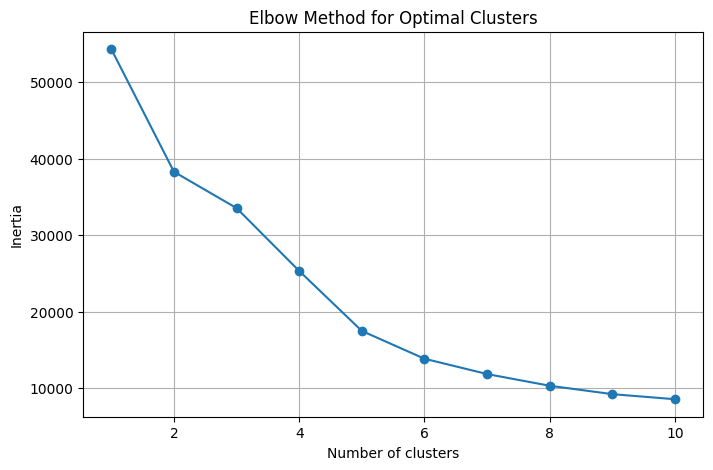

In [ ]:
# Step 1: Determine Optimal Number of Clusters Using the Elbow Method
inertia = []
K_range = range(1, 11)  # Test for cluster counts from 1 to 10

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Step 2: Plot the Elbow Method Results
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertia, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Clusters')
plt.grid(True)
plt.show()

In [ ]:
# Apply K-means clustering
kmeans = KMeans(n_clusters=4, random_state=42)
listings_austin['cluster'] = kmeans.fit_predict(X_scaled)

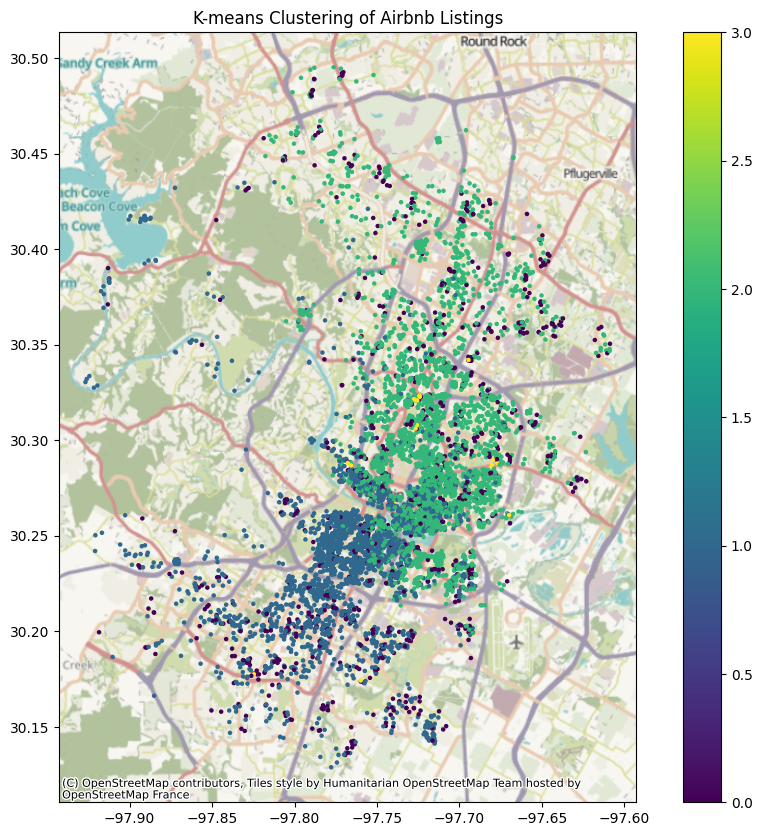

In [ ]:
# Visualize clusters on a map
fig, ax = plt.subplots(figsize=(12, 10))
listings_austin.plot(ax=ax, column='cluster', cmap='viridis', markersize=5, legend=True)
ctx.add_basemap(ax, crs=listings_austin.crs.to_string())
plt.title('K-means Clustering of Airbnb Listings')
plt.show()

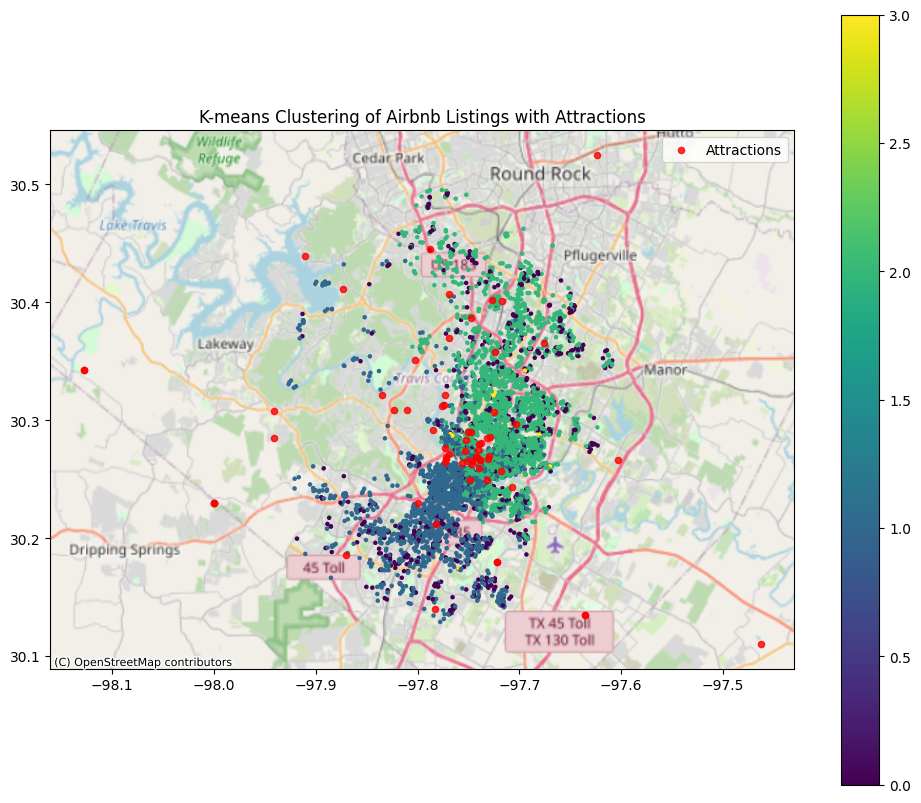

In [ ]:
# Plot clusters with attractions
fig, ax = plt.subplots(figsize=(12, 10))

# Plot Airbnb listings by cluster
listings_austin.plot(ax=ax, column='cluster', cmap='viridis', markersize=5, legend=True)

# Plot attractions on top of clusters
attractions_gpdf.plot(ax=ax, color='red', markersize=20, label='Attractions', alpha=0.8)

# Add basemap for context
ctx.add_basemap(ax, crs=listings_austin.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Customize plot appearance
plt.title('K-means Clustering of Airbnb Listings with Attractions')
plt.legend()
plt.show()


<ipython-input-186-ed15bf2f0386>:12: DeprecationWarning:

The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.



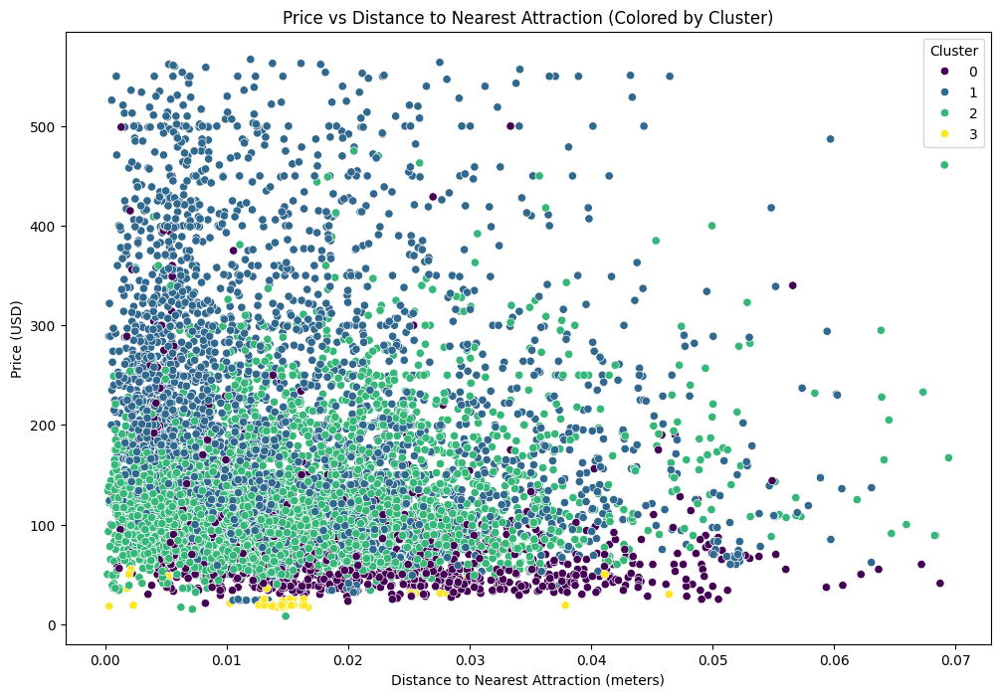

          count      mean       std       min       25%       50%       75%  \
cluster                                                                       
0         971.0  0.021383  0.013021  0.000345  0.010668  0.019559  0.029799   
1        3097.0  0.014804  0.011715  0.000291  0.005536  0.011304  0.020939   
2        3633.0  0.015555  0.010941  0.000171  0.006798  0.013409  0.022193   
3          56.0  0.015892  0.008616  0.000322  0.013064  0.014759  0.015486   

              max  
cluster            
0        0.068747  
1        0.063094  
2        0.069444  
3        0.046428  


In [ ]:
#Calculate Distances and Visualize Results
from shapely.ops import nearest_points
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure CRS is consistent between Airbnb listings and attractions
attractions_gpdf = attractions_gpdf.to_crs(listings_austin.crs)

# Function to calculate distance to nearest attraction
def nearest_attraction_distance(point, attractions_gpdf):
    nearest_geom = nearest_points(point, attractions_gpdf.unary_union)[1]
    return point.distance(nearest_geom)

# Calculate distance to nearest attraction for each listing
listings_austin['distance_to_attraction'] = listings_austin['geometry'].apply(
    lambda x: nearest_attraction_distance(x, attractions_gpdf)
)

# Visualize relationship between price and distance to attraction by cluster
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='distance_to_attraction',
    y='price',
    hue='cluster',
    data=listings_austin,
    palette='viridis'
)
plt.title('Price vs Distance to Nearest Attraction (Colored by Cluster)')
plt.xlabel('Distance to Nearest Attraction (meters)')
plt.ylabel('Price (USD)')
plt.legend(title='Cluster')
plt.show()

# Display summary statistics for each cluster
summary = listings_austin.groupby('cluster')['distance_to_attraction'].describe()
print(summary)


Cluster 2: Coefficient = 816.26, Intercept = 113.62
Cluster 1: Coefficient = -1645.58, Intercept = 247.29
Cluster 0: Coefficient = -1457.32, Intercept = 112.11
Cluster 3: Coefficient = 126.79, Intercept = 22.70


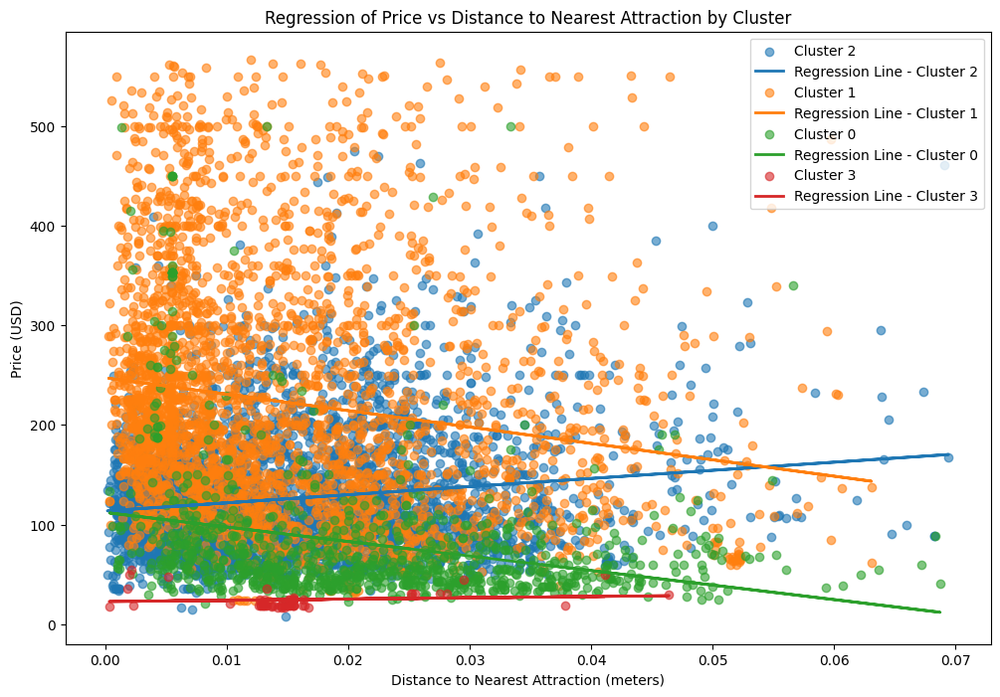

In [ ]:
#Regression Analysis
from sklearn.linear_model import LinearRegression
import numpy as np

# Perform regression for each cluster
plt.figure(figsize=(12, 8))

for cluster in listings_austin['cluster'].unique():
    cluster_data = listings_austin[listings_austin['cluster'] == cluster]

    # Prepare data
    X = cluster_data['distance_to_attraction'].values.reshape(-1, 1)
    y = cluster_data['price'].values

    # Fit regression model
    model = LinearRegression()
    model.fit(X, y)

    # Predict and plot regression line
    y_pred = model.predict(X)
    plt.scatter(X, y, label=f'Cluster {cluster}', alpha=0.6)
    plt.plot(X, y_pred, label=f'Regression Line - Cluster {cluster}', linewidth=2)

    # Print regression coefficients
    print(f"Cluster {cluster}: Coefficient = {model.coef_[0]:.2f}, Intercept = {model.intercept_:.2f}")

# Plot settings
plt.title('Regression of Price vs Distance to Nearest Attraction by Cluster')
plt.xlabel('Distance to Nearest Attraction (meters)')
plt.ylabel('Price (USD)')
plt.legend()
plt.show()


Cluster 2: Coefficient = 816.26, Intercept = 113.62
  Mean Squared Error (MSE): 3423.27
  R-squared (R²): 0.02
  Cross-validated R²: 0.00 ± 0.02

Cluster 1: Coefficient = -1645.58, Intercept = 247.29
  Mean Squared Error (MSE): 13767.78
  R-squared (R²): 0.03
  Cross-validated R²: 0.01 ± 0.01

Cluster 0: Coefficient = -1457.32, Intercept = 112.11
  Mean Squared Error (MSE): 4303.45
  R-squared (R²): 0.08
  Cross-validated R²: 0.00 ± 0.11

Cluster 3: Coefficient = 126.79, Intercept = 22.70
  Mean Squared Error (MSE): 83.96
  R-squared (R²): 0.01
  Cross-validated R²: -0.70 ± 0.38



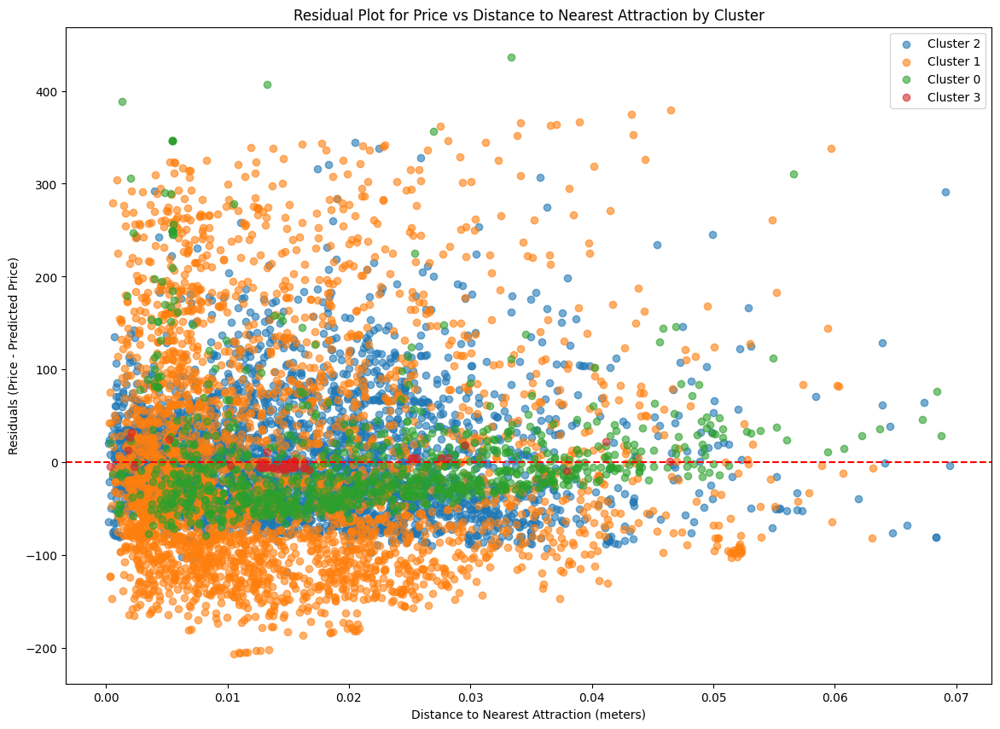

In [ ]:
#Residual Analysis and Cross-Validation
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

# Perform regression and residual analysis for each cluster
plt.figure(figsize=(14, 10))

for cluster in listings_austin['cluster'].unique():
    cluster_data = listings_austin[listings_austin['cluster'] == cluster]

    # Prepare data
    X = cluster_data['distance_to_attraction'].values.reshape(-1, 1)
    y = cluster_data['price'].values

    # Fit regression model
    model = LinearRegression()
    model.fit(X, y)

    # Predict and calculate residuals
    y_pred = model.predict(X)
    residuals = y - y_pred

    # Plot residuals
    plt.scatter(X, residuals, label=f'Cluster {cluster}', alpha=0.6)

    # Print regression coefficients and model performance metrics
    print(f"Cluster {cluster}: Coefficient = {model.coef_[0]:.2f}, Intercept = {model.intercept_:.2f}")
    print(f"  Mean Squared Error (MSE): {mean_squared_error(y, y_pred):.2f}")
    print(f"  R-squared (R²): {r2_score(y, y_pred):.2f}")

    # Cross-validation (5-fold)
    scores = cross_val_score(model, X, y, cv=5, scoring='r2')
    print(f"  Cross-validated R²: {scores.mean():.2f} ± {scores.std():.2f}\n")

# Plot settings for residuals
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residual Plot for Price vs Distance to Nearest Attraction by Cluster')
plt.xlabel('Distance to Nearest Attraction (meters)')
plt.ylabel('Residuals (Price - Predicted Price)')
plt.legend()
plt.show()


Cluster Summary (Mean Values):
          latitude  longitude       price  room_type_Entire home/apt  \
cluster                                                                
0        30.276330 -97.737988   80.949537                   0.000000   
1        30.244126 -97.764387  222.930578                   0.999677   
2        30.302599 -97.719406  126.320396                   0.997523   
3        30.307379 -97.725756   24.714286                   0.000000   

         room_type_Private room  room_type_Shared room  room_type_Hotel room  
cluster                                                                       
0                           1.0                    0.0              0.000000  
1                           0.0                    0.0              0.000323  
2                           0.0                    0.0              0.002477  
3                           0.0                    1.0              0.000000  


<Figure size 1200x600 with 0 Axes>

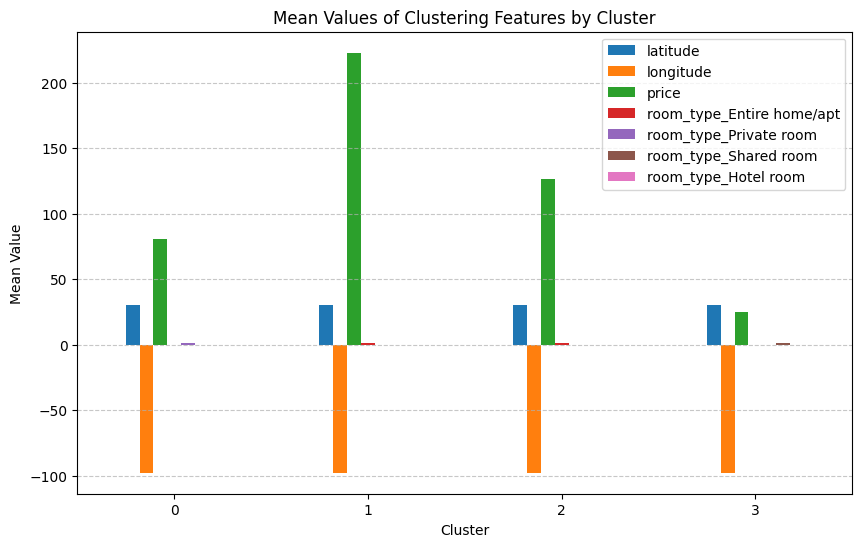

In [ ]:
# Calculate mean values of clustering features within each cluster
cluster_summary = listings_austin.groupby('cluster')[['latitude', 'longitude', 'price',
                                                      'room_type_Entire home/apt',
                                                      'room_type_Private room',
                                                      'room_type_Shared room',
                                                      'room_type_Hotel room']].mean()

# Display the cluster summary as a table
print("Cluster Summary (Mean Values):")
print(cluster_summary)

# Visualize the cluster summary using bar plots
plt.figure(figsize=(12, 6))
cluster_summary.plot(kind='bar', figsize=(10, 6), legend=True)
plt.title('Mean Values of Clustering Features by Cluster')
plt.ylabel('Mean Value')
plt.xlabel('Cluster')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


Cluster Summary (Mean Values and Counts):
          latitude  longitude       price  room_type_Entire home/apt  \
cluster                                                                
0        30.276330 -97.737988   80.949537                   0.000000   
1        30.244126 -97.764387  222.930578                   0.999677   
2        30.302599 -97.719406  126.320396                   0.997523   
3        30.307379 -97.725756   24.714286                   0.000000   

         room_type_Private room  room_type_Shared room  room_type_Hotel room  \
cluster                                                                        
0                           1.0                    0.0              0.000000   
1                           0.0                    0.0              0.000323   
2                           0.0                    0.0              0.002477   
3                           0.0                    1.0              0.000000   

         count  
cluster         
0         

<Figure size 1400x700 with 0 Axes>

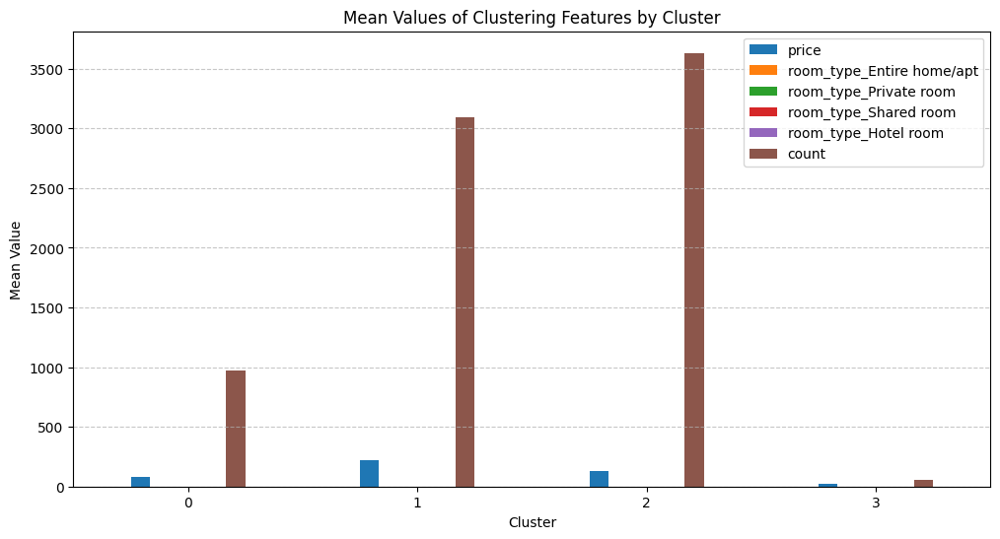

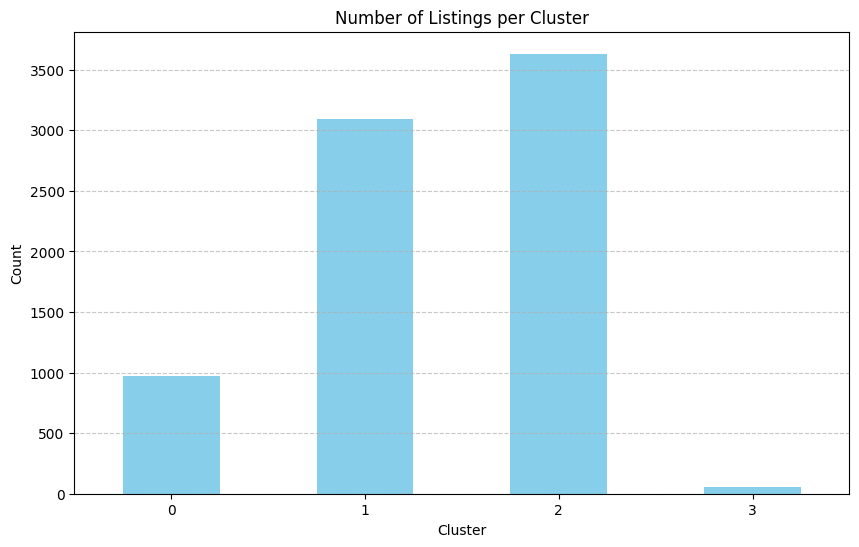

In [ ]:
# Calculate mean values of clustering features within each cluster
cluster_summary = listings_austin.groupby('cluster')[['latitude', 'longitude', 'price',
                                                      'room_type_Entire home/apt',
                                                      'room_type_Private room',
                                                      'room_type_Shared room',
                                                      'room_type_Hotel room']].mean()

# Count the number of listings per cluster
cluster_counts = listings_austin['cluster'].value_counts().sort_index()

# Add the counts to the summary
cluster_summary['count'] = cluster_counts

# Display the cluster summary as a table
print("Cluster Summary (Mean Values and Counts):")
print(cluster_summary)

# Visualize the cluster summary using bar plots
plt.figure(figsize=(14, 7))
cluster_summary.drop(columns=['latitude', 'longitude']).plot(kind='bar', figsize=(12, 6), legend=True)
plt.title('Mean Values of Clustering Features by Cluster')
plt.ylabel('Mean Value')
plt.xlabel('Cluster')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Plot cluster counts separately
plt.figure(figsize=(10, 6))
cluster_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Listings per Cluster')
plt.ylabel('Count')
plt.xlabel('Cluster')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()
